**OVERVIEW**

In this application, you will explore a dataset from kaggle. The original dataset contained information on 3 million used cars. The provided dataset contains information on 426K cars to ensure speed of processing.  Your goal is to understand what factors make a car more or less expensive.  As a result of your analysis, you should provide clear recommendations to your client -- a used car dealership -- as to what consumers value in a used car.

### CRISP-DM Framework

<center>
    <img src = images/crisp.png width = 20%/>
</center>


To frame the task, throughout our practical applications we will refer back to a standard process in industry for data projects called CRISP-DM.  This process provides a framework for working through a data problem.  Your first step in this application will be to read through a brief overview of CRISP-DM [here](https://mo-pcco.s3.us-east-1.amazonaws.com/BH-PCMLAI/module_11/readings_starter.zip).  After reading the overview, answer the questions below.

## Business Understanding

From a business perspective, we are tasked with identifying key drivers for used car prices.  In the CRISP-DM overview, we are asked to convert this business framing to a data problem definition.  Using a few sentences, reframe the task as a data task with the appropriate technical vocabulary. 

### Objectives

Business objectives

- Provides insights for a dealership to maximize profit per car
- Argument used car pricing process for sale in a dealership
- Understand customer perference

Technical objectives
- Find `important factor` that effect price of a used car 

### Success Criteria

- Train a model `predicts price of a used car`

### Data Understanding

After considering the business understanding, we want to get familiar with our data.  Write down some steps that you would take to get to know the dataset and identify any quality issues within.  Take time to get to know the dataset and explore what information it contains and how this could be used to inform your business understanding.

Findings
- Price range of car is beteen 0 and 3,736,928,711 (3B?)
    - Data quality need to be reviewed
    - 360,000 for Ferrari looks reasonable, but price for Toyota 3.7B isn't reasonable
    - 0 for a car isn't reasonable
- Around 4 % of data have missing value
- `id` and `VIN` are unique random number
- 42 different car brand (= manufacturer) 
- Unbalanced
- Quality
    - Manufacturer, condition, Cylinders, fuel, title_status, transmission, drive, size, type, paint_color, state are fine
    - Issue with unclear model names
- Pricing factors
    - `state` and `region` are significant factors
    - `title_status` - if the status is not `clean` then the price can be lower 
    - `year` - postive correlation with price
    - `odometer` - negative correlation with price


Questions
- What is currency of car price? Is it all USD or mix of USD and other
- Is this list price, traded in/out or sell in/out price?

Next step
- Use the price in minium 500.00 to maximum 400,000.00
- Don't use id, VIN

To run this notebook you need to install following packages

```text
pandas
numpy
jupyter
matplotlib
plotly
seaborn
scikit-learn
plotly
statsmodels
kaleido
```

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.model_selection import train_test_split
from sklearn.compose import make_column_transformer
from sklearn.inspection import permutation_importance
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, PolynomialFeatures, StandardScaler
from sklearn.model_selection import GridSearchCV

%matplotlib inline


In [2]:
used_car = pd.read_csv("./data/vehicles.csv")
used_car.head()

,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
0,7222695916,prescott,6000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,az
1,7218891961,fayetteville,11900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ar
2,7221797935,florida keys,21000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,fl
3,7222270760,worcester / central MA,1500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ma
4,7210384030,greensboro,4900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,nc


__Missing value check__

Data Shape (426880, 18) 



Text(0.5, 1.0, 'Missing data')

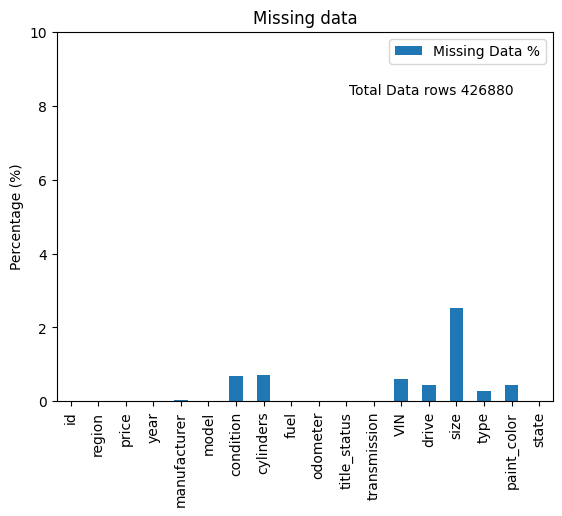

In [3]:
print("Data Shape", used_car.shape, "\n")
fig_missing_data = (pd.DataFrame(round(used_car.isnull().sum()/used_car.count(), 2), columns=["Missing Data %"])).plot.bar()
fig_missing_data.text(x=10.1, y=8.3, s=f"Total Data rows {used_car.shape[0]}")
fig_missing_data.set_ybound(upper=10.0)
fig_missing_data.set_ylabel("Percentage (%)")
fig_missing_data.set_title("Missing data")

__Car price range__

Initial analysis around `price` 

<AxesSubplot:>

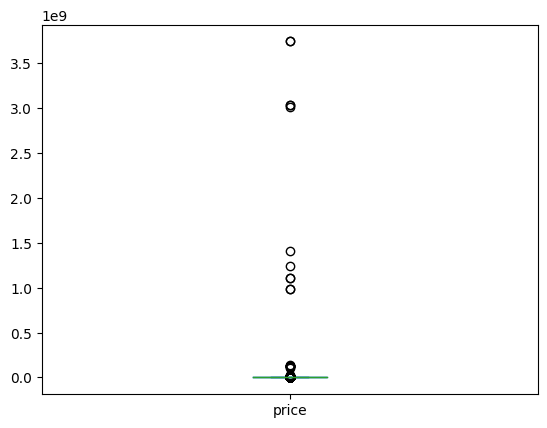

In [4]:
# Simple visualization for used car price
used_car["price"].plot.box()

In [5]:
# Find exact range of the price
min_car_price = used_car["price"].min()
max_car_price = used_car["price"].max()
print(f"Used car price range is beteen {min_car_price} and {max_car_price}")

Used car price range is beteen 0 and 3736928711


__Free cars?__

Need to review the free cars

In [6]:
used_car[used_car["price"] == 0]

,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
10,7218893038,el paso,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,tx
11,7218325704,el paso,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,tx
12,7217788283,el paso,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,tx
13,7217147606,el paso,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,tx
14,7209027818,el paso,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,tx
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
426764,7303347225,wyoming,0,2018.0,NaN,peterbilt 579,NaN,NaN,diesel,1.0,clean,automatic,NaN,NaN,NaN,NaN,NaN,wy
426812,7302877815,wyoming,0,2006.0,toyota,scion tc,excellent,4 cylinders,gas,195000.0,clean,automatic,JTKDE177460109655,fwd,NaN,NaN,silver,wy
426832,7302353283,wyoming,0,2004.0,toyota,prius,excellent,4 cylinders,hybrid,239000.0,clean,automatic,JTDKB20U840108051,fwd,NaN,NaN,blue,wy
426836,7302301268,wyoming,0,2018.0,ram,2500,excellent,6 cylinders,diesel,20492.0,clean,automatic,3C6UR5HL3JG307217,4wd,full-size,truck,white,wy


__Used car price quantiles__

In [7]:
quantiles = [0.01, 0.05, 0.1, 0.25, 0.5, 0.75, 0.9, 0.99, 0.999, 0.9999]
print("Used car price quntiles")
for q in quantiles:
    print(f"{q*100} % Quantile", used_car["price"].quantile(q=q))

Used car price quntiles
1.0 % Quantile 0.0
5.0 % Quantile 0.0
10.0 % Quantile 500.0
25.0 % Quantile 5900.0
50.0 % Quantile 13950.0
75.0 % Quantile 26485.75
90.0 % Quantile 37590.0
99.0 % Quantile 66995.0
99.9 % Quantile 120000.0
99.99 % Quantile 1234567.0


Adjusted used car price
- Min and max range for cars

In [8]:
fig_Box_used_car_price = px.box(data_frame=used_car, x="price", title="Used car price range", range_x=[0.0, 400000.0], height=600)
fig_Box_used_car_price.show()

In [9]:
# Find exact range of the price
adj_min_car_price = used_car["price"].quantile(q=0.1)
adj_max_car_price = used_car["price"].quantile(q=0.999)
print(f"Used car price range is beteen {adj_min_car_price} and {adj_max_car_price}")

Used car price range is beteen 500.0 and 120000.0


C:\Users\hyssh\AppData\Local\Temp\ipykernel_30764\2401201869.py:7: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



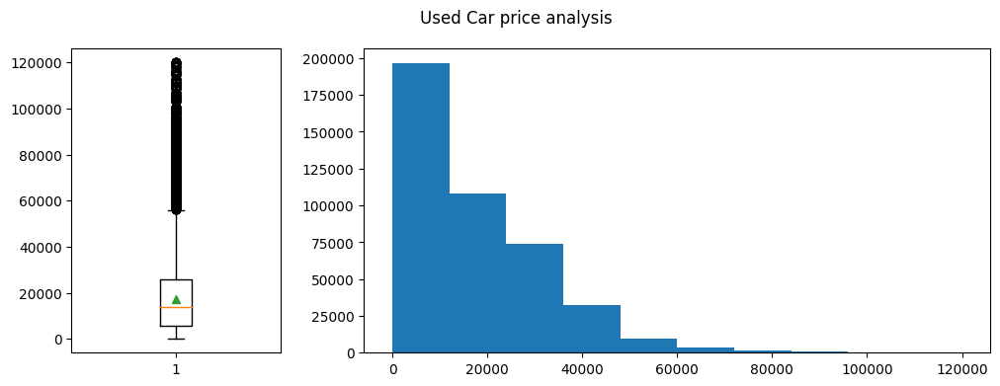

In [10]:
figs_used_car_price, ax = plt.subplots(1,2, figsize=(12,4), gridspec_kw={"width_ratios": [1, 3]})
# fig_box_used_car_price = sns.boxplot()
ax[0].boxplot(used_car[used_car["price"] < adj_max_car_price]["price"], showmeans=True, showcaps=True)
# fig_hist_used_car_price = sns.histplot()
ax[1].hist(used_car[used_car["price"] < adj_max_car_price]["price"])
figs_used_car_price.suptitle("Used Car price analysis")
figs_used_car_price.show()

__Odometer__


In [11]:
quantiles = [0.01, 0.05, 0.1, 0.25, 0.5, 0.75, 0.9, 0.99, 0.999, 0.9999]
print("Used car odometer quntiles")
for q in quantiles:
    print(f"{q*100} % Quantile", used_car["odometer"].quantile(q=q))

adj_min_car_odo = used_car["odometer"].quantile(q=0.01)
adj_max_car_odo = used_car["odometer"].quantile(q=0.99)

Used car odometer quntiles
1.0 % Quantile 2.0
5.0 % Quantile 6318.0
10.0 % Quantile 14939.0
25.0 % Quantile 37704.0
50.0 % Quantile 85548.0
75.0 % Quantile 133542.5
90.0 % Quantile 177377.10000000038
99.0 % Quantile 280000.0
99.9 % Quantile 1111111.0
99.99 % Quantile 10000000.0


C:\Users\hyssh\AppData\Local\Temp\ipykernel_30764\3336256269.py:7: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



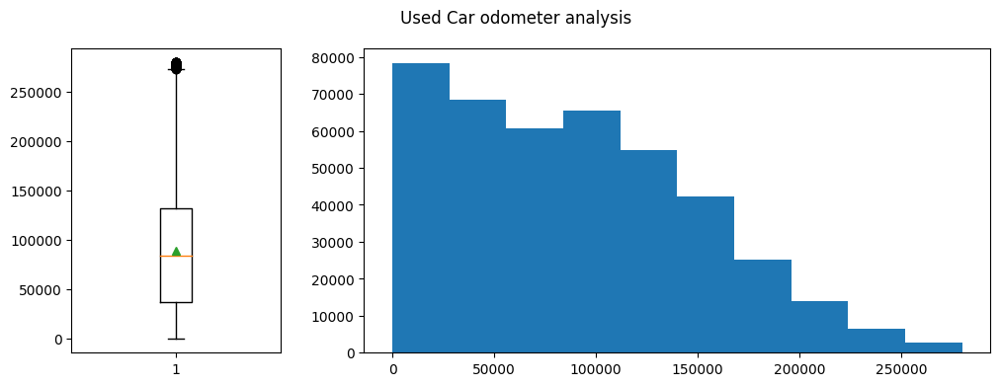

In [12]:
figs_used_car_price, ax = plt.subplots(1,2, figsize=(12,4), gridspec_kw={"width_ratios": [1, 3]})
# fig_box_used_car_price = sns.boxplot()
ax[0].boxplot(used_car[used_car["odometer"] < adj_max_car_odo]["odometer"], showmeans=True, showcaps=True)
# fig_hist_used_car_price = sns.histplot()
ax[1].hist(used_car[used_car["odometer"] < adj_max_car_odo]["odometer"])
figs_used_car_price.suptitle("Used Car odometer analysis")
figs_used_car_price.show()

__Used car price differ by brand__

Since the origianl car prices are different by its brand, used car also show price difference among car brands
- Select cars with conditions for example, sedan, gas, automatic

Aston-martin or porsche show higher mean price than others becase they are more expensive than others


__Manufacturers__

The top 10 best seller brand ['ford', 'chevrolet', 'toyota', 'honda', 'nissan', 'jeep', 'ram', 'gmc', 'bmw', 'dodge']


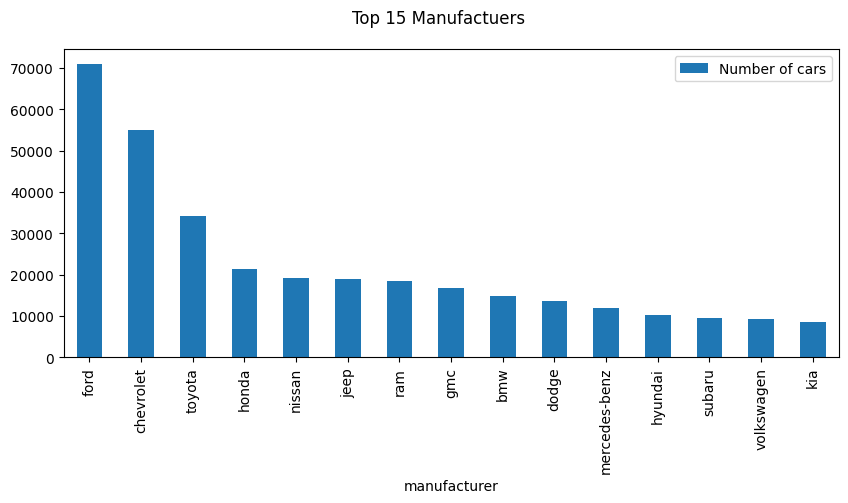

In [13]:
top10_manufacturers = used_car.groupby(["manufacturer"]).size().sort_values(ascending=False)[:10].index.to_list()
print("The top 10 best seller brand", top10_manufacturers)

fig_bar_manufacturers = used_car.groupby(["manufacturer"]).size().sort_values(ascending=False)[:15].rename("Number of cars", inplace=True).plot.bar(figsize=(10, 4))
fig_bar_manufacturers.figure.suptitle("Top 15 Manufactuers")
fig_bar_manufacturers.legend()
fig_bar_manufacturers.figure.savefig("./images/fig_bar_manufacturers.png")

In [14]:
fig_Box_used_car_price_brand = px.box(
                    data_frame=used_car.query("type == 'sedan' & fuel == 'gas' & transmission == 'automatic' & price > @adj_min_car_price & price < @adj_max_car_price & title_status == 'clean' & condition in ['excellent','good']"),
                    x="price",
                    title="Used car price range by manufacturer",
                    range_x=[0.0, 200000.0],
                    color="manufacturer",
                    height=900
)

fig_Box_used_car_price_brand.add_annotation(x=1, y=0.01, showarrow=False,
    text=f"Note: Query conditions are Ford, White, SUV, Gas, Automatic, {adj_min_car_price} < Price < {adj_max_car_price}",
    xref="paper",
    yref="paper")

fig_Box_used_car_price_brand.show()

__Used car price different across state__

Take one car brand with specific conditions to see price differences among states
- Ford, white, suv, gas, automatic 

In [15]:
fig_Box_used_car_price_by_state = px.box(
    data_frame=used_car.query(
        "manufacturer == 'ford' & \
            paint_color == 'white' & \
                type == 'SUV' &\
                     fuel == 'gas' &\
                         transmission == 'automatic' &\
                             price > @adj_min_car_price &\
                                 price < @adj_max_car_price &\
                                     title_status == 'clean' &\
                                         condition in ['excellent','good']"),
    x="price",
    title="'Ford' Used car price range by state",
    range_x=[0.0, 130000.0],
    color="state",
    height=900)

fig_Box_used_car_price_by_state.add_annotation(x=1, y=0.01, showarrow=False,
    text=f"Note: Query conditions are Ford, White, SUV, Gas, Automatic cars , {adj_min_car_price} < Price < {adj_max_car_price}, good or excellent condition",
    xref="paper",
    yref="paper")

fig_Box_used_car_price_by_state.show()

The price of similiar car price different among state.

In [16]:
avg_used_car_price_by_state = used_car.query(\
    "manufacturer == 'ford' & \
    paint_color == 'white' & \
    type == 'SUV' & fuel == 'gas' & \
    transmission == 'automatic' & \
    price > @adj_min_car_price & \
    price < @adj_max_car_price & \
    title_status == 'clean' &\
    condition in ['excellent','good']").\
    groupby(["state"]). \
    mean()[["price"]]. \
    sort_values("price", ascending=False)

print(f"The most expensive state {str(avg_used_car_price_by_state.index[0].upper())} {(avg_used_car_price_by_state.max()[0])} and the cheaptest {str(avg_used_car_price_by_state.index[-1]).upper()} {avg_used_car_price_by_state.min()[0]}")
print(f"The gap between the two state is {avg_used_car_price_by_state.max()[0] - avg_used_car_price_by_state.min()[0]}.")
# avg_used_car_price_by_state.sort_values("price", ascending=False).plot.bar(figsize=(10, 4))


The most expensive state VT 35597.0 and the cheaptest MD 4875.0
The gap between the two state is 30722.0.


There is significant difference of a car price among state. 

In [17]:
fig_Box_used_car_price_by_state = px.box(
    data_frame=used_car.query("manufacturer == 'ford' & paint_color == 'white' & type == 'SUV' & fuel == 'gas' & transmission == 'automatic' & price > @adj_min_car_price & price < @adj_max_car_price"),
    x="price",
    title="'Ford' Used car price range by region",
    range_x=[0.0, 130000.0],
    color="region",
    height=900)

fig_Box_used_car_price_by_state.add_annotation(x=1, y=0.01, showarrow=False,
    text=f"Note: Query conditions are Ford, White, SUV, Gas, Automatic cars , {adj_min_car_price} < Price < {adj_max_car_price}",
    xref="paper",
    yref="paper")
fig_Box_used_car_price_by_state.show()

There is significant difference of a car price among regions.

__Car price by its condition__

Car condition is impoart factor to distingush price of a car

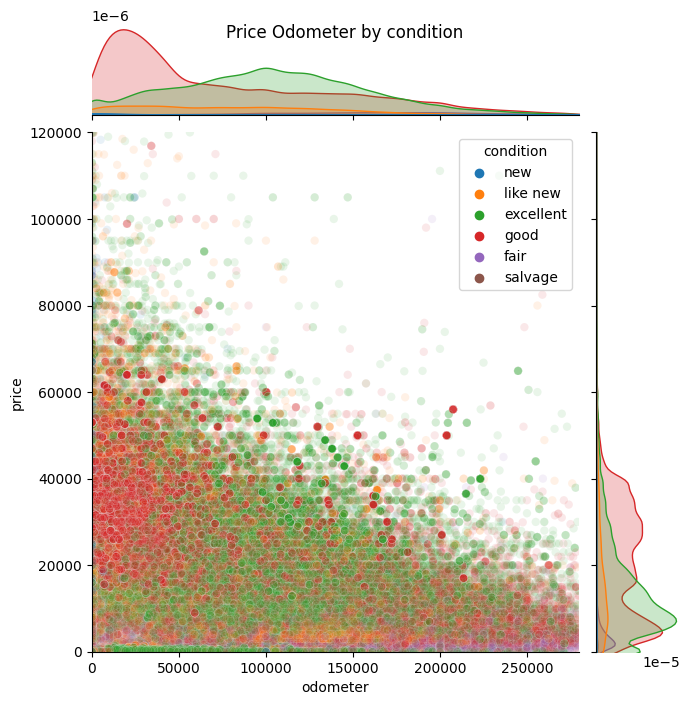

In [18]:
# figs_used_car_price, ax = plt.subplots(1,2, figsize=(10,4), gridspec_kw={"width_ratios": [1, 3]})
# fig_scatter_used_car_price = sns.scatterplot(data=used_car[(used_car["price"] < 400000)&(used_car["odometer"] < 278000)], x="odometer", y="price", hue="condition", sizes=(20,4))
car_condition_order = ["new", "like new", "excellent", "good", "fair", "salvage"]
fig_jointplt_used_car_price_odo = sns.jointplot(
    data=used_car[(used_car["price"] < adj_max_car_price)&(used_car["odometer"] < adj_max_car_odo)],
    x="odometer",
    y="price",
    hue="condition", 
    height=7,
    hue_order=car_condition_order,
    alpha=0.1,
    xlim=(0, adj_max_car_odo),
    ylim=(0, adj_max_car_price))
fig_jointplt_used_car_price_odo.figure.suptitle("Price Odometer by condition")
# sns.move_legend(fig_jointplt_used_car_price_odo, "upper right", bbox_to_anchor=(1, 1))
fig_jointplt_used_car_price_odo.savefig("./images/fig_jointplt_price_odometer_by_condition.png", bbox_inches='tight', pad_inches=0.1)

__Odometer and car brand__

Maker (a.k.a manufacturer) doesn't have strong correlation with price

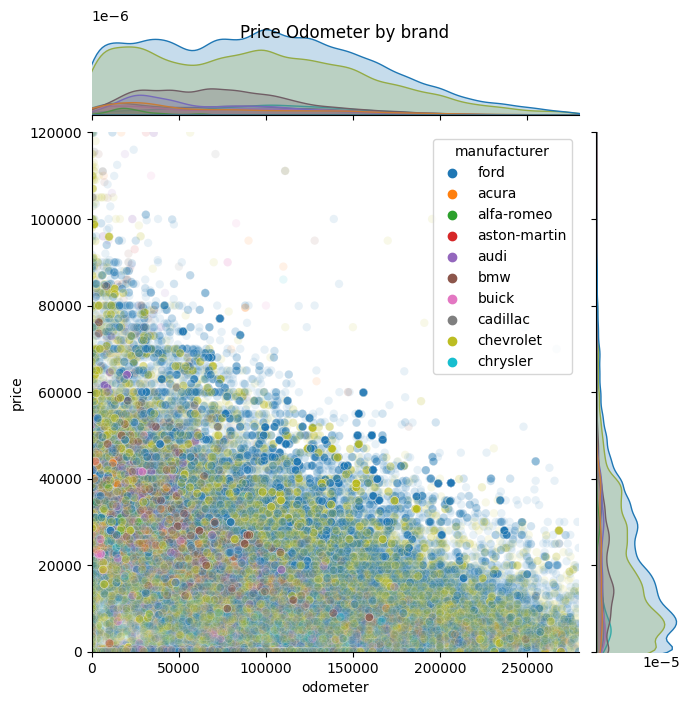

In [19]:
# Too many car brand, narrow down to top 10 for analysis
top_10_brand = ['ford', 'acura',  'alfa-romeo', 'aston-martin', 'audi', 'bmw', 'buick', 'cadillac', 'chevrolet', 'chrysler']
fig_jointplt_used_car_price_brand = sns.jointplot(
    data=used_car[(used_car["price"] < adj_max_car_price)&(used_car["odometer"] < adj_max_car_odo)].query("manufacturer in @top_10_brand"),
    x="odometer",
    y="price",
    hue="manufacturer",
    height=7,
    hue_order=top_10_brand,
    alpha=0.1,
    xlim=(0, adj_max_car_odo),
    ylim=(0, adj_max_car_price))
fig_jointplt_used_car_price_brand.figure.suptitle("Price Odometer by brand")
# sns.move_legend(fig_jointplt_used_car_price_brand, "upper left", bbox_to_anchor=(1, 1))
fig_jointplt_used_car_price_brand

__State and car Odometer__

There is not enough proof that tell State effect to car price

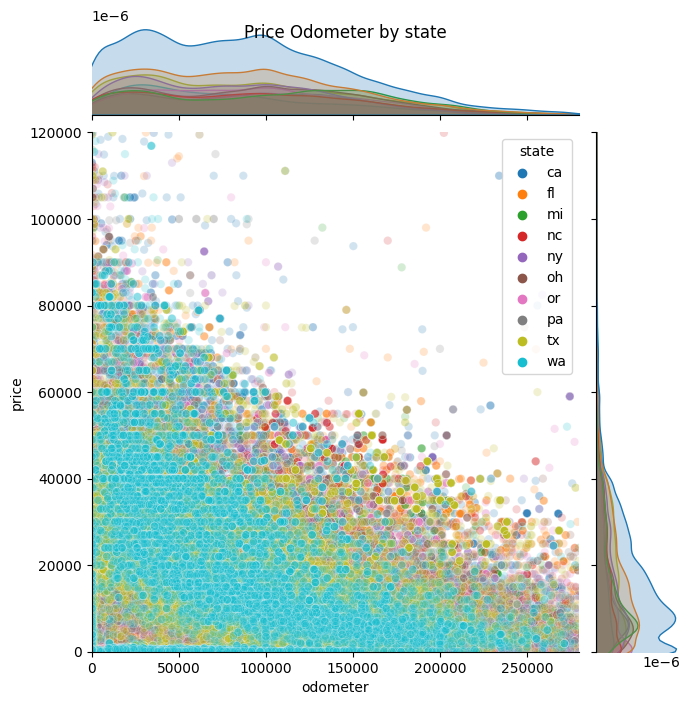

In [20]:
top_10_states = ['ca', 'fl', 'tx', 'ny', 'oh', 'or', 'mi', 'nc', 'wa', 'pa']
fig_jointplt_used_car_price_state = sns.jointplot(
    data=used_car[(used_car["price"] < adj_max_car_price)&(used_car["odometer"] < adj_max_car_odo)].query("state in @top_10_states"),
    x="odometer",
    y="price",
    hue="state",
    height=7,
    alpha=0.2,
    xlim=(0, adj_max_car_odo),
    ylim=(0, adj_max_car_price))
fig_jointplt_used_car_price_state.figure.suptitle("Price Odometer by state")
fig_jointplt_used_car_price_state

In [21]:
# # used_car[used_car["price"] < 1000000 ].mean()
# fig_Box_used_car_price = px.box(data_frame=used_car, x="price", title="Used car price range", range_x=[400000.0, 3736929000.0], color="manufacturer", height=600)
# fig_Box_used_car_price.show()

In [22]:
print(top10_manufacturers)
car_brand_ratio = pd.DataFrame(used_car.groupby(["manufacturer"]).size().reset_index()).rename(columns={0:"counts"})
fig_car_brand_ratio = px.pie(data_frame = car_brand_ratio, names="manufacturer", values="counts", title = "Car Brands", width=900, height=600)
# car_brand_ratio[:10]["manufacturer"].to_list()
# fig_car_brand_ratio.update_layout()
# fig_car_brand_ratio.write_image("./images/fig_car_brand_ratio.jpeg")
fig_car_brand_ratio.show()
# # used_car["manufacturer"].value_counts()

['ford', 'chevrolet', 'toyota', 'honda', 'nissan', 'jeep', 'ram', 'gmc', 'bmw', 'dodge']


Find correlation between price and cylinders, fuel, odometer, title_status,transmission,size,type,paint_color

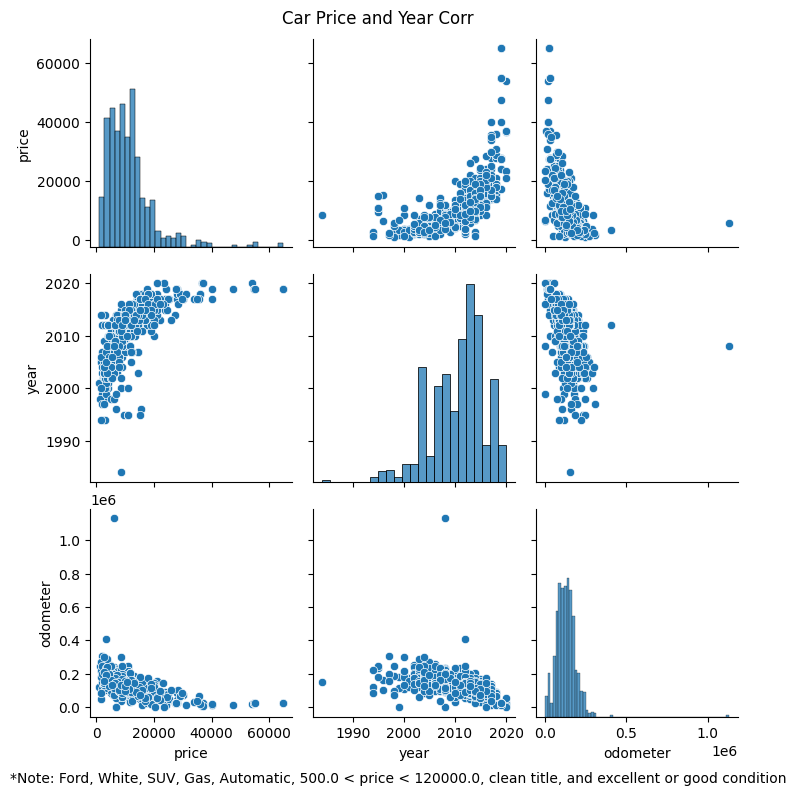

In [23]:
numeric_data_columns = ["price", "year", "odometer"]
numeric_data = used_car.query( \
    "manufacturer == 'ford' & \
    paint_color == 'white' & \
    type == 'SUV' & fuel == 'gas' & \
    transmission == 'automatic' & \
    price > @adj_min_car_price & \
    price < @adj_max_car_price & \
    title_status == 'clean' &\
    condition in ['excellent','good']"
)[numeric_data_columns]
numeric_data = numeric_data.dropna()
fig_pairplot = sns.pairplot(data=numeric_data)
fig_pairplot.figure.suptitle(t="Car Price and Year Corr", y=1.02)
fig_pairplot.figure.text(x=0.01, y=-0.01, s=f"*Note: Ford, White, SUV, Gas, Automatic, {adj_min_car_price} < price < {adj_max_car_price}, clean title, and excellent or good condition")
fig_pairplot.savefig("./images/fig_pairplot_price_year_odometer.png")

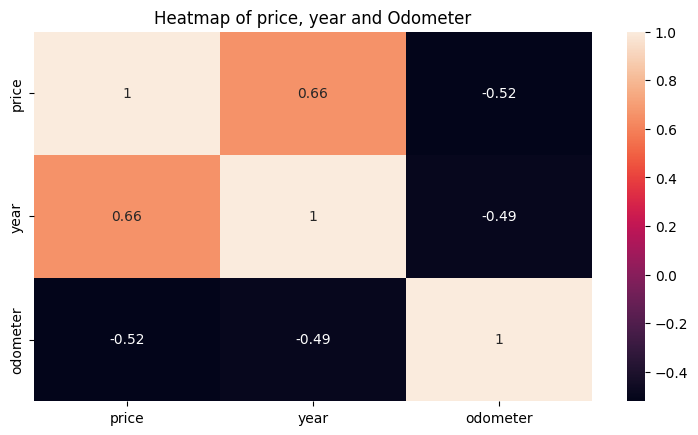

In [24]:
fig_heatmap_price_year_odo = sns.heatmap(numeric_data.corr(), annot=True)
fig_heatmap_price_year_odo.set_title("Heatmap of price, year and Odometer")
fig_heatmap_price_year_odo.figure.savefig("./images/fig_heatmap_outiler_removed_numeric_data.png")
fig_heatmap_price_year_odo.figure.set_figwidth(9)

__Remove outliers__

- After removing outliers for price, odometer we found there are meaningful correlation between features


In [25]:
# out_reomved_df = numeric_data[(numeric_data["price"]>adj_max_car_price)&(numeric_data["price"]<adj_max_car_price)&(numeric_data["odometer"]<adj_max_car_odo)]
# fig_heatmap_out_removed = sns.heatmap(out_reomved_df.corr(), annot=True)
# fig_heatmap_out_removed.figure.suptitle("Car Price and Year Corr")
# fig_heatmap_out_removed.figure.savefig("./images/fig_heatmap_outiler_removed_numeric_data.png")
# fig_heatmap_out_removed.figure.set_figwidth(12)
# fig_heatmap_out_removed

In [26]:
# fig_pairplot_out_removed = sns.pairplot(data=out_reomved_df)
# fig_pairplot_out_removed.figure.suptitle("Car Price and Year Corr")
# fig_pairplot_out_removed.figure.set_figwidth(12)
# fig_pairplot_out_removed

In [27]:
categorical_data = ['region', 'manufacturer', 'model', 'condition',
       'cylinders', 'fuel', 'title_status', 'transmission',
       'drive', 'size', 'type', 'paint_color', 'state']
       
# for item in categorical_data:
#        print(item)
#        print(used_car[item].value_counts())
#        print()

In [28]:
# # plt.bar(data=used_car.groupby(categorical_data[0]).size().reset_index(), x="region", y=0, height=1000)
# fig_car_per_region = pd.DataFrame(used_car.groupby(categorical_data[-1]).size().sort_values(ascending=False)).rename(columns={0:"Number of cars"})[:10].plot.bar(title="Business per State", figsize=(10, 4))
# fig_car_per_region.legend()
# fig_car_per_region

In [29]:
# # pd.DataFrame(used_car.groupby(categorical_data[0]).size().sort_values(ascending=False))[:15]
# pd.DataFrame(used_car.groupby(categorical_data[1]).size().sort_values(ascending=False))[:15]#.plot.bar()

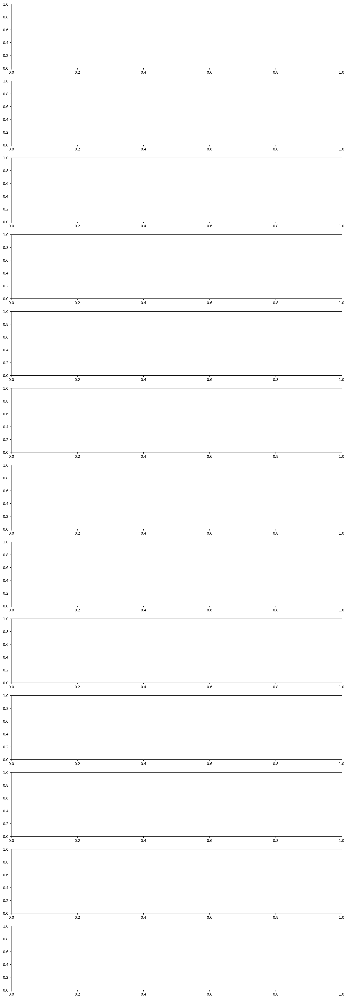

In [30]:
fig_categorical_features, ax = plt.subplots(nrows=len(categorical_data), ncols=1, sharex=False, sharey=False, figsize=(16, 48))

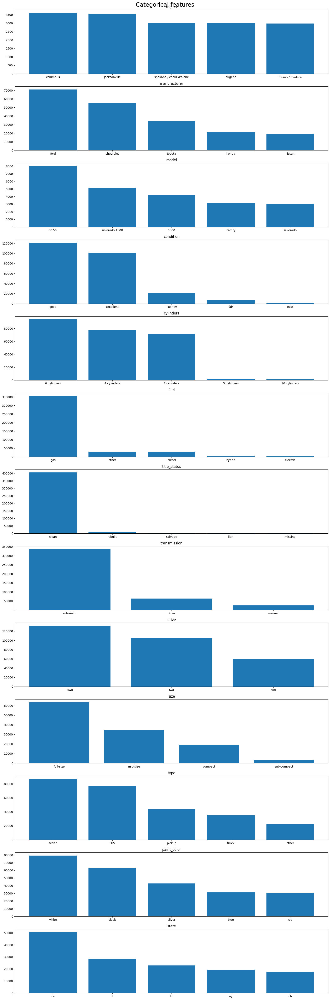

In [31]:
for i in range(0, len(categorical_data)):
    ax[i].bar(x=pd.DataFrame(used_car.groupby(categorical_data[i]).size().sort_values(ascending=False)).rename(columns={0:"Number of Car"})[:5].index, 
                height=pd.DataFrame(used_car.groupby(categorical_data[i]).size().sort_values(ascending=False)).rename(columns={0:"Number of Car"})[:5]["Number of Car"])
    ax[i].set_title(categorical_data[i])
    ax[i].figure.tight_layout()

fig_categorical_features.savefig("./images/fig_categorical_bar_chart.png", bbox_inches='tight', pad_inches=0.1)
fig_categorical_features.suptitle(t="Categorical features", y=1.0, size=20)
fig_categorical_features

<AxesSubplot:xlabel='year', ylabel='Count'>

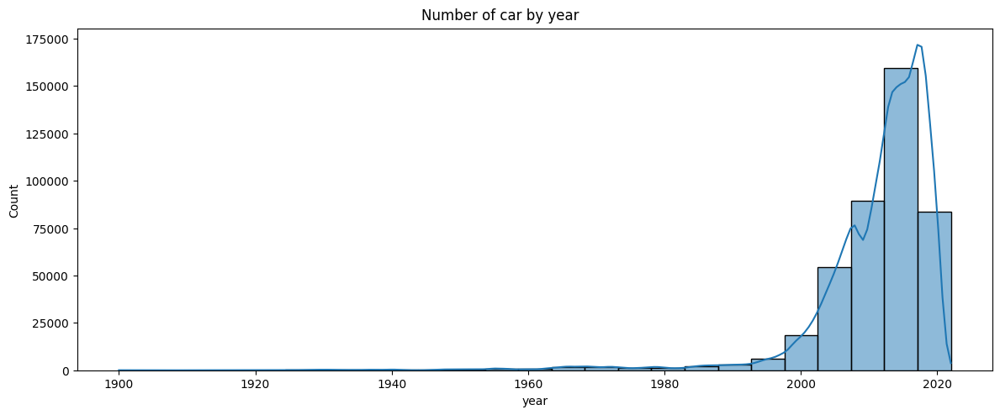

In [32]:
fig_bar_num_of_car_by_year = sns.histplot(data=used_car, x="year", kde=True, bins=25)
fig_bar_num_of_car_by_year.figure.set_figwidth(12)
fig_bar_num_of_car_by_year.figure.tight_layout()
fig_bar_num_of_car_by_year.figure.suptitle(t="Number of car by year", y=1.02)
fig_bar_num_of_car_by_year.figure.savefig("./images/fig_bar_num_of_car_by_year.png")
fig_bar_num_of_car_by_year

Does `title_status` effect car price?

- Select cars Ford, SUV, white, automatic, gas, in CA and compare mean price by title_status

<bound method _make_class_factory.<locals>.class_factory.<locals>.subcls.set of <AxesSubplot:title={'center':'Price difference by title status'}, xlabel='title_status'>>

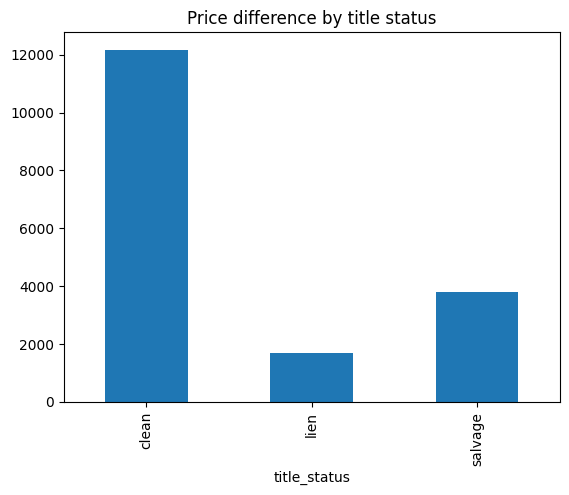

In [33]:
# = used_car[(numeric_data["price"]>500)&(numeric_data["price"]<100000)]
title_status_order = ["clean", "rebuilt", "salvage", "lien", "missing", "parts only"]
title_status_price = used_car.query(\
    "manufacturer == 'ford' & \
    paint_color == 'white' & \
    type == 'SUV' &\
    fuel == 'gas' & \
    transmission == 'automatic' & \
    price > @adj_min_car_price & \
    price < @adj_max_car_price & \
    state == 'ca' &\
    condition in ['excellent','good']").drop(["id", "VIN"], axis=1)
fig_bar_price_by_title = title_status_price.groupby("title_status").mean()["price"].plot.bar(title="Price difference by title status")
fig_bar_price_by_title.set

__Yes, there are price difference by the `title_status`__

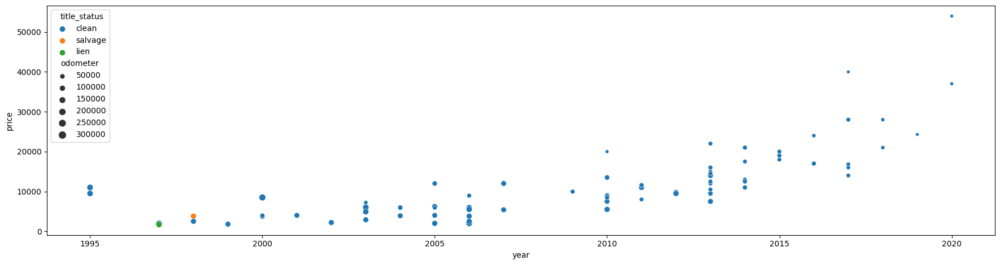

In [34]:
fig_catplt_odometer_year = sns.scatterplot(data=title_status_price, x="year", y="price" , hue="title_status", size="odometer")
fig_catplt_odometer_year.figure.tight_layout()
fig_catplt_odometer_year.figure.set_figwidth(20)
fig_catplt_odometer_year.figure.savefig("./images/fig_scatter_year_price_by_title_status.png",bbox_inches="tight", pad_inches=0.05 )

State and cylinders

### Data Preparation

After our initial exploration and fine tuning of the business understanding, it is time to construct our final dataset prior to modeling.  Here, we want to make sure to handle any integrity issues and cleaning, the engineering of new features, any transformations that we believe should happen (scaling, logarithms, normalization, etc.), and general preparation for modeling with `sklearn`. 

__Drop missing rows__

In [35]:
# Select price between 500 and 120000
# Drop columns; id, VIN, model
# Drop NaN
print(f"Select car price between {adj_min_car_price} and {adj_max_car_price}")
df = used_car.drop(["id", "VIN", "model"], axis=1).query(\
    "price > @adj_min_car_price & \
    price < @adj_max_car_price & \
    odometer < @adj_max_car_odo"
    ).dropna()
print("Data Shape", df.shape)
df.head()

Select car price between 500.0 and 120000.0
Data Shape (74040, 15)


,region,price,year,manufacturer,condition,cylinders,fuel,odometer,title_status,transmission,drive,size,type,paint_color,state
31,auburn,15000,2013.0,ford,excellent,6 cylinders,gas,128000.0,clean,automatic,rwd,full-size,truck,black,al
55,auburn,19900,2004.0,ford,good,8 cylinders,diesel,88000.0,clean,automatic,4wd,full-size,pickup,blue,al
59,auburn,14000,2012.0,honda,excellent,6 cylinders,gas,95000.0,clean,automatic,fwd,full-size,mini-van,silver,al
65,auburn,22500,2001.0,ford,good,8 cylinders,diesel,144700.0,clean,manual,rwd,full-size,truck,white,al
73,auburn,15000,2017.0,dodge,excellent,8 cylinders,gas,90000.0,rebuilt,automatic,rwd,mid-size,sedan,grey,al


__Change data types__

Convert `year` to string to make it as categorical feature

In [36]:
df["year"] = df["year"].apply(lambda x: str(x).split(sep=".")[0])

In [37]:
# new car is better than old
car_make_year = df["year"].value_counts().index.sort_values(ascending=False).to_list()
print(car_make_year[:10])

['2022', '2021', '2020', '2019', '2018', '2017', '2016', '2015', '2014', '2013']


__Transform__

Use OneHotEncoding for region, year, manufacturer, cylinders, fuel, transmission, drive, size, type, paint_color, state

Use OrdinalEncoding for condition, title_status

In [38]:
label_name = "price"
print(car_condition_order)
print()
print(title_status_order)
print()
print(car_make_year)
print()
print(df.columns)


['new', 'like new', 'excellent', 'good', 'fair', 'salvage']

['clean', 'rebuilt', 'salvage', 'lien', 'missing', 'parts only']

['2022', '2021', '2020', '2019', '2018', '2017', '2016', '2015', '2014', '2013', '2012', '2011', '2010', '2009', '2008', '2007', '2006', '2005', '2004', '2003', '2002', '2001', '2000', '1999', '1998', '1997', '1996', '1995', '1994', '1993', '1992', '1991', '1990', '1989', '1988', '1987', '1986', '1985', '1984', '1983', '1982', '1981', '1980', '1979', '1978', '1977', '1976', '1975', '1974', '1973', '1972', '1971', '1970', '1969', '1968', '1967', '1966', '1965', '1964', '1963', '1962', '1961', '1960', '1959', '1958', '1957', '1956', '1955', '1954', '1953', '1952', '1951', '1950', '1949', '1948', '1947', '1946', '1944', '1942', '1941', '1940', '1939', '1938', '1937', '1936', '1935', '1934', '1933', '1932', '1931', '1930', '1929', '1928', '1927', '1926', '1925', '1924', '1923', '1918', '1916', '1913', '1905', '1900']

Index(['region', 'price', 'year', 'manufacturer

In [39]:
# split data into two for training and 
y= df[label_name]
X = df.drop(label_name, axis=1)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1)

In [40]:
# select columns for encoding
ohe_column_names = ["region", "manufacturer", "cylinders", "fuel", "transmission", "drive", "size", "type", "paint_color", "state"]
oe_column_names = ["condition", "title_status"]

mct = make_column_transformer(
    (OneHotEncoder(handle_unknown="infrequent_if_exist"), ohe_column_names),
    (OrdinalEncoder(categories=[car_condition_order]), ["condition"]),
    (OrdinalEncoder(categories=[title_status_order]), ["title_status"]),
    (OrdinalEncoder(categories=[car_make_year]), ["year"]),
    (PolynomialFeatures(degree=2), ["odometer"])
)


### Modeling

With your (almost?) final dataset in hand, it is now time to build some models.  Here, you should build a number of different regression models with the price as the target.  In building your models, you should explore different parameters and be sure to cross-validate your findings.

In [41]:
# collect MSE to compare different experiments
mses = {}

In [42]:
baseline_model = Pipeline([
    ("preprocessing", mct),
    ("linreg", LinearRegression())
])

baseline_model.fit(X_train, y_train)

Pipeline(steps=[('preprocessing',
                 ColumnTransformer(transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='infrequent_if_exist'),
                                                  ['region', 'manufacturer',
                                                   'cylinders', 'fuel',
                                                   'transmission', 'drive',
                                                   'size', 'type',
                                                   'paint_color', 'state']),
                                                 ('ordinalencoder-1',
                                                  OrdinalEncoder(categories=[['new',
                                                                              'like '
                                                                              'new',
                                                                              'excellent',
                                                                              'good',
                                                                              'fair',
                                                                              'salvage']]),
                                                  ['cond...
                                                 ('ordinalencoder-3',
                                                  OrdinalEncoder(categories=[['2022',
                                                                              '2021',
                                                                              '2020',
                                                                              '2019',
                                                                              '2018',
                                                                              '2017',
                                                                              '2016',
                                                                              '2015',
                                                                              '2014',
                                                                              '2013',
                                                                              '2012',
                                                                              '2011',
                                                                              '2010',
                                                                              '2009',
                                                                              '2008',
                                                                              '2007',
                                                                              '2006',
                                                                              '2005',
                                                                              '2004',
                                                                              '2003',
                                                                              '2002',
                                                                              '2001',
                                                                              '2000',
                                                                              '1999',
                                                                              '1998',
                                                                              '1997',
                                                                              '1996',
                                                                              '1995',
                                                                              '1994',
                                                                              '1993', ...]]),
                            

__Get baseline model__

Linear Regression

In [43]:
baseline_y_pred = baseline_model.predict(X_test)
mse_baseline_model = mean_squared_error(y_test, baseline_y_pred)
mae_baseline_model = mean_absolute_error(y_test, baseline_y_pred)

mses["linreg_model_w_region"] = mse_baseline_model

print("Baseline Linear Regression Model MSE: ", mse_baseline_model)
print("Baseline Linear Regression Model MAE: ", mae_baseline_model)

Baseline Linear Regression Model MSE:  123095392.55896679
Baseline Linear Regression Model MAE:  8110.4360078998925


<AxesSubplot:title={'center':'Linear Regression model score result'}, xlabel='True car price', ylabel='Pred car price'>

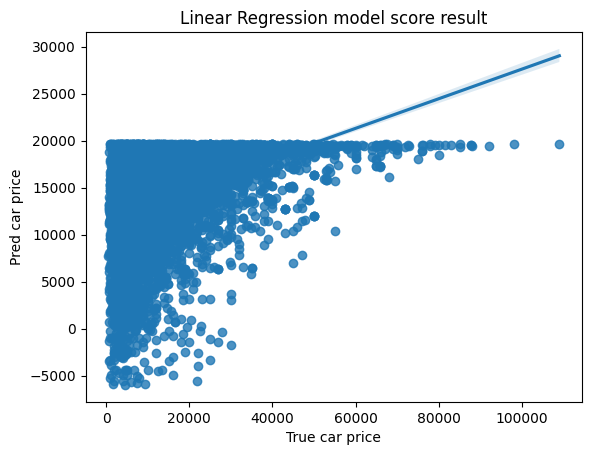

In [44]:
fig_scatter_baseline_result = sns.regplot(x="True car price", y="Pred car price", data=pd.DataFrame({"True car price":y_test, "Pred car price":baseline_y_pred}))
fig_scatter_baseline_result.set_title("Linear Regression model score result")
fig_scatter_baseline_result

In [45]:
from sklearn.inspection import permutation_importance

per_importance_baseline_model = permutation_importance(baseline_model, X_test, y_test)

for i in per_importance_baseline_model.importances_mean.argsort():
    print(f"{mct.get_feature_names_out()[i]}")

onehotencoder__region_SF bay area
onehotencoder__region_abilene
onehotencoder__region_akron / canton
onehotencoder__region_albany
onehotencoder__region_albuquerque
onehotencoder__region_altoona-johnstown
onehotencoder__region_ames
onehotencoder__region_anchorage / mat-su
onehotencoder__region_ann arbor
onehotencoder__region_annapolis
onehotencoder__region_appleton-oshkosh-FDL
onehotencoder__region_asheville
onehotencoder__region_ashtabula
onehotencoder__region_amarillo


__Try Ridge model__

Ridge Model MSE:  114423615.06607428
Ridge Mode MAE:  7606.56209392895
onehotencoder__region_anchorage / mat-su
onehotencoder__region_abilene
onehotencoder__region_albany
onehotencoder__region_amarillo
onehotencoder__region_ames
onehotencoder__region_SF bay area
onehotencoder__region_ashtabula
onehotencoder__region_akron / canton
onehotencoder__region_asheville
onehotencoder__region_annapolis
onehotencoder__region_altoona-johnstown
onehotencoder__region_albuquerque
onehotencoder__region_appleton-oshkosh-FDL
onehotencoder__region_ann arbor


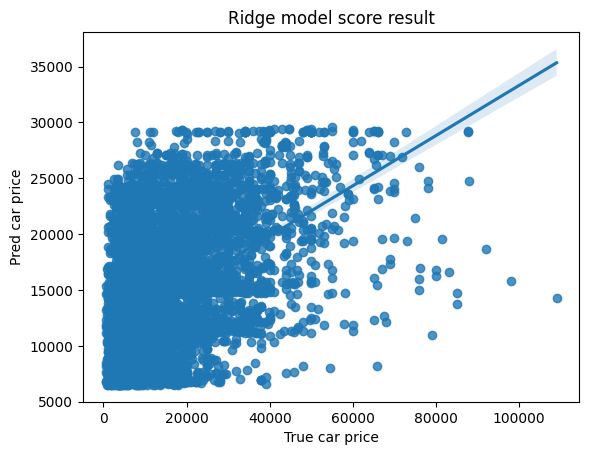

In [46]:
# Select price between 500 and 400000
# Drop column; id, VIN, model, region, state
# Drop NaN

# ohe_column_names = ["region", "manufacturer", "cylinders", "fuel", "transmission", "drive", "size", "type", "paint_color", "state"]
# oe_column_names = ["condition", "title_status"]

# mct = make_column_transformer(
#     (OneHotEncoder(handle_unknown="infrequent_if_exist"), ohe_column_names),
#     (OrdinalEncoder(categories=[car_condition_order]), ["condition"]),
#     (OrdinalEncoder(categories=[title_status_order]), ["title_status"]),
#     (OrdinalEncoder(categories=[car_make_year]), ["year"]),
#     (PolynomialFeatures(degree=2), ["odometer"])
# )


ridge_model = Pipeline([
    ("preprocessing", mct),
    ("ridge", Ridge(positive=True))
])

ridge_model.fit(X_train, y_train)

ridge_y_pred = ridge_model.predict(X_test)
mse_ridge_model = mean_squared_error(y_test, ridge_y_pred)
mae_ridge_model = mean_absolute_error(y_test, ridge_y_pred)

mses["ridge_model"] = round(mse_ridge_model, 2)

print("Ridge Model MSE: ", mse_ridge_model)
print("Ridge Mode MAE: ", mae_ridge_model)

fig_scatter_ridge_result = sns.regplot(x="True car price", y="Pred car price", data=pd.DataFrame({"True car price":y_test, "Pred car price":ridge_y_pred}))
fig_scatter_ridge_result.set_title("Ridge model score result")
fig_scatter_ridge_result

per_importance_ridge_model = permutation_importance(ridge_model, X_test, y_test)

for i in per_importance_ridge_model.importances_mean.argsort():
    print(f"{mct.get_feature_names_out()[i]}")

__Try Lasso__

Ridge Model MSE:  98000493.63669422
Ridge Model MAE:  7008.869098649539
onehotencoder__region_abilene
onehotencoder__region_albany
onehotencoder__region_amarillo
onehotencoder__region_ames
onehotencoder__region_anchorage / mat-su
onehotencoder__region_annapolis
onehotencoder__region_albuquerque
onehotencoder__region_ashtabula
onehotencoder__region_asheville
onehotencoder__region_akron / canton
onehotencoder__region_SF bay area
onehotencoder__region_ann arbor
onehotencoder__region_appleton-oshkosh-FDL
onehotencoder__region_altoona-johnstown


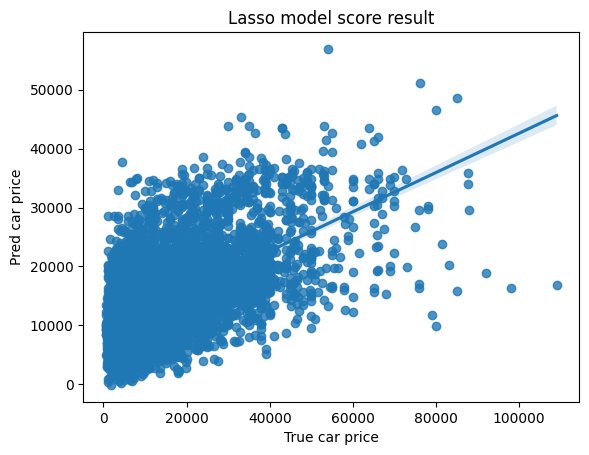

In [47]:
# Select price between 500 and 400000
# Drop column; id, VIN, model, region, state
# Drop NaN

# ohe_column_names = ["region", "manufacturer", "cylinders", "fuel", "transmission", "drive", "size", "type", "paint_color", "state"]
# oe_column_names = ["condition", "title_status"]

# mct = make_column_transformer(
#     (OneHotEncoder(handle_unknown="infrequent_if_exist"), ohe_column_names),
#     (OrdinalEncoder(categories=[car_condition_order]), ["condition"]),
#     (OrdinalEncoder(categories=[title_status_order]), ["title_status"]),
#     (OrdinalEncoder(categories=[car_make_year]), ["year"]),
#     (PolynomialFeatures(degree=2), ["odometer"])
# )

lasso_model = Pipeline([
    ("preprocessing", mct),
    ("lasso", Lasso(positive=True))
])

lasso_model.fit(X_train, y_train)

lasso_y_pred = lasso_model.predict(X_test)
mse_lasso_model = mean_squared_error(y_test, lasso_y_pred)
mae_lasso_model = mean_absolute_error(y_test, lasso_y_pred)

mses["lasso_model"] = round(mse_lasso_model, 2)

print("Ridge Model MSE: ", mse_lasso_model)
print("Ridge Model MAE: ", mae_lasso_model)

fig_scatter_lasso_result = sns.regplot(x="True car price", y="Pred car price", data=pd.DataFrame({"True car price":y_test, "Pred car price":lasso_y_pred}))
fig_scatter_lasso_result.set_title("Lasso model score result")
fig_scatter_lasso_result

per_importance_lasso_model = permutation_importance(lasso_model, X_test, y_test)

for i in per_importance_lasso_model.importances_mean.argsort():
    print(f"{mct.get_feature_names_out()[i]}")

__Parameter Tunning__

Use Gridsearch CV using Ridge

c:\Users\hyssh\Anaconda3\envs\pcmlai\lib\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning:


240 fits failed out of a total of 280.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
40 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\hyssh\Anaconda3\envs\pcmlai\lib\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\hyssh\Anaconda3\envs\pcmlai\lib\site-packages\sklearn\pipeline.py", line 382, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "c:\Users\hyssh\Anaconda3\envs\pcmlai\lib\site-packages\sklearn\linear_model\_ridge.py", line 1130, in fit
    re

Grid Search Ridge Model MSE:  108301123.53909981
Grid Search Ridge Model MAE:  7435.623793886116
onehotencoder__region_abilene
onehotencoder__region_albany
onehotencoder__region_amarillo
onehotencoder__region_anchorage / mat-su
onehotencoder__region_ames
onehotencoder__region_annapolis
onehotencoder__region_SF bay area
onehotencoder__region_ashtabula
onehotencoder__region_akron / canton
onehotencoder__region_albuquerque
onehotencoder__region_asheville
onehotencoder__region_appleton-oshkosh-FDL
onehotencoder__region_altoona-johnstown
onehotencoder__region_ann arbor


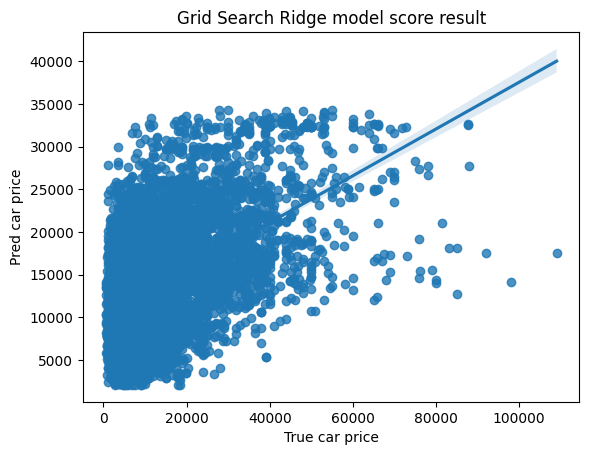

In [48]:
# Resuing previous transform data
# mct = make_column_transformer(
#     (OneHotEncoder(handle_unknown="infrequent_if_exist"), ohe_column_names),
#     (OrdinalEncoder(categories=[car_condition_order]), ["condition"]),
#     (OrdinalEncoder(categories=[title_status_order]), ["title_status"]),
#     (OrdinalEncoder(categories=[car_make_year]), ["year"]),
#     (PolynomialFeatures(degree=2), ["odometer"])
# )

ridge_model = Pipeline([
    ("preprocessing", mct),
    ("ridge", Ridge(positive=True))
])

params = {
    "ridge__alpha":[0.01, 0.1, 1, 10],
    "ridge__solver":['svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga', 'lbfgs'],
    "preprocessing__polynomialfeatures__degree":[2, 3]    
}


gcv_ridge = GridSearchCV(
    estimator=ridge_model,
    param_grid=params,
    scoring="neg_mean_squared_error",
    cv=5
)

gcv_ridge.fit(X=X, y=y)

gcv_ridge_y_pred = gcv_ridge.best_estimator_.predict(X_test)
mse_gcv_ridge = mean_squared_error(y_test, gcv_ridge_y_pred)
mae_gcv_ridge = mean_absolute_error(y_test, gcv_ridge_y_pred)

mses["gcv_ridge"] = round(mse_gcv_ridge, 2)

print("Grid Search Ridge Model MSE: ", mse_gcv_ridge)
print("Grid Search Ridge Model MAE: ", mae_gcv_ridge)

fig_scatter_gcv_ridge_result = sns.regplot(x="True car price", y="Pred car price", data=pd.DataFrame({"True car price":y_test, "Pred car price":gcv_ridge_y_pred}))
fig_scatter_gcv_ridge_result.set_title("Grid Search Ridge model score result")
fig_scatter_gcv_ridge_result

per_importance_gcv_ridge_best_model = permutation_importance(gcv_ridge.best_estimator_, X_test, y_test)

for i in per_importance_gcv_ridge_best_model.importances_mean.argsort():
    print(f"{gcv_ridge.best_estimator_[0].get_feature_names_out()[i]}")


__Parameter Tunning__

Use Gridsearch CV using Lasso

In [49]:
# # Resuing previous transform data
# # ohe_column_names = ["region", "manufacturer", "cylinders", "fuel", "transmission", "drive", "size", "type", "paint_color", "state"]
# # oe_column_names = ["condition", "title_status"]

# # mct = make_column_transformer(
# #     (OneHotEncoder(handle_unknown="infrequent_if_exist"), ohe_column_names),
# #     (OrdinalEncoder(categories=[car_condition_order]), ["condition"]),
# #     (OrdinalEncoder(categories=[title_status_order]), ["title_status"]),
# #     (OrdinalEncoder(categories=[car_make_year]), ["year"]),
# #     (PolynomialFeatures(degree=2), ["odometer"])
# # )

# lasso_model = Pipeline([
#     ("preprocessing", mct),
#     ("lasso", Lasso())
# ])

# params = {
#     "lasso__alpha":[0.01, 0.1, 1],
#     "lasso__fit_intercept":[True, False],
#     "preprocessing__polynomialfeatures__degree":[2, 3]
# }

# gcv_lasso = GridSearchCV(
#     estimator=lasso_model,
#     param_grid=params,
#     scoring="neg_mean_squared_error",
#     cv=5
# )

# gcv_lasso.fit(X=X, y=y)

# gcv_lasso_y_pred = gcv_lasso.best_estimator_.predict(X_test)
# mse_gcv_lasso = mean_squared_error(y_test, gcv_lasso_y_pred)
# mae_gcv_lasso = mean_absolute_error(y_test, gcv_lasso_y_pred)

# mses["gcv_lasso"] = round(mse_gcv_lasso, 2)

# print("Grid Search Lasso Model MSE: ", mse_gcv_lasso)
# print("Grid Search Lasso Model MAE: ", mae_gcv_lasso)

# fig_scatter_gcv_lasso_result = sns.regplot(x="True car price", y="Pred car price", data=pd.DataFrame({"True car price":y_test, "Pred car price":gcv_lasso_y_pred}))
# fig_scatter_gcv_lasso_result.set_title("Grid Search Lasso model score result")

# per_importance_gcv_lasso_best_model = permutation_importance(gcv_lasso.best_estimator_, X_test, y_test)

# for i in per_importance_gcv_lasso_best_model.importances_mean.argsort():
#     print(f"{gcv_lasso.best_estimator_[0].get_feature_names_out()[i]}")


So far, the best model is

In [50]:
# gcv_lasso_best_estimator_coef = pd.DataFrame({"feature_names":gcv_lasso.best_estimator_.named_steps["preprocessing"].get_feature_names_out(), "coef_":gcv_lasso.best_estimator_.named_steps["lasso"].coef_})
# gcv_lasso_best_estimator_coef["coef_"] = gcv_lasso_best_estimator_coef["coef_"].apply(lambda x: (float(x)))
# gcv_lasso_best_estimator_coef[gcv_lasso_best_estimator_coef["coef_"] >0].sort_values("coef_", ascending=False).head(20)

In [51]:
# gcv_lasso_best_estimator_coef[gcv_lasso_best_estimator_coef["coef_"] >0].sort_values("coef_", ascending=False).tail(20)

### Evaluation

With some modeling accomplished, we aim to reflect on what we identify as a high quality model and what we are able to learn from this.  We should review our business objective and explore how well we can provide meaningful insight on drivers of used car prices.  Your goal now is to distill your findings and determine whether the earlier phases need revisitation and adjustment or if you have information of value to bring back to your client.

__Remove `region` and `state` from the data set__

Use Linear Regression

Data Shape (74040, 13)
Baseline Linear Regression Model MSE:  126978774.65183493
Baseline Linear Regression Model MAE:  8191.152510259576
onehotencoder__manufacturer_acura
onehotencoder__manufacturer_alfa-romeo
onehotencoder__manufacturer_aston-martin
onehotencoder__manufacturer_audi
onehotencoder__manufacturer_bmw
onehotencoder__manufacturer_cadillac
onehotencoder__manufacturer_chevrolet
onehotencoder__manufacturer_chrysler
onehotencoder__manufacturer_datsun
onehotencoder__manufacturer_dodge
onehotencoder__manufacturer_ferrari
onehotencoder__manufacturer_buick


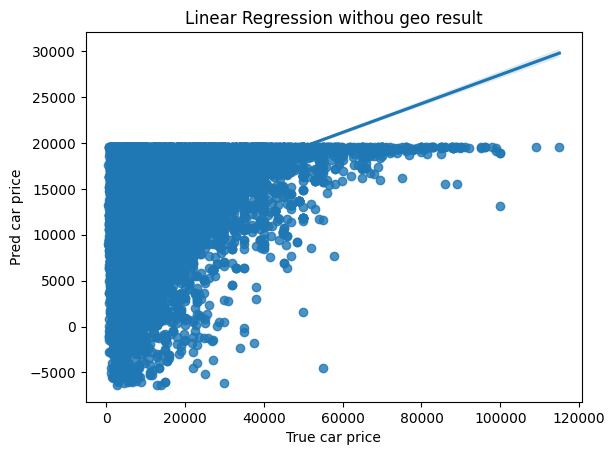

In [52]:
# Select price between 500 and 400000
# Drop column; id, VIN, model, region, state
# Drop NaN
df_wo_geo = used_car.drop(["id", "VIN", "model","region", "state"], axis=1).\
    query("price > @adj_min_car_price &\
        price < @adj_max_car_price &\
            odometer < @adj_max_car_odo").\
                dropna()
df_wo_geo["year"] = df_wo_geo["year"].apply(lambda x: str(x).split(sep=".")[0])

print("Data Shape", df_wo_geo.shape)
df_wo_geo.head()

wo_geo_y= df_wo_geo[label_name]
wo_geo_X = df_wo_geo.drop(label_name, axis=1)

X_train_wo_geo, X_test_wo_geo, y_train_wo_geo, y_test_wo_geo = train_test_split(wo_geo_X, wo_geo_y, test_size=0.3)

ohe_column_names = ["manufacturer", "cylinders", "fuel", "transmission", "drive", "size", "type", "paint_color"]
oe_column_names = ["condition", "title_status"]

mct = make_column_transformer(
    (OneHotEncoder(handle_unknown="infrequent_if_exist"), ohe_column_names),
    (OrdinalEncoder(categories=[car_condition_order]), ["condition"]),
    (OrdinalEncoder(categories=[title_status_order]), ["title_status"]),
    (OrdinalEncoder(categories=[car_make_year]), ["year"]),
    (PolynomialFeatures(degree=2), ["odometer"])
)

baseline_model_wo_geo = Pipeline([
    ("preprocessing", mct),
    ("linreg", LinearRegression())
])

baseline_model_wo_geo.fit(X_train_wo_geo, y_train_wo_geo)

baseline_model_wo_geo_y_pred = baseline_model_wo_geo.predict(X_test_wo_geo)
mse_baseline_model_wo_geo = mean_squared_error(y_test_wo_geo, baseline_model_wo_geo_y_pred)
mae_baseline_model_wo_geo = mean_absolute_error(y_test_wo_geo, baseline_model_wo_geo_y_pred)

mses["linreg_model_wo_geo"] = round(mse_baseline_model, 2)

print("Baseline Linear Regression Model MSE: ", mse_baseline_model_wo_geo)
print("Baseline Linear Regression Model MAE: ", mae_baseline_model_wo_geo)

mse_baseline_model_wo_geo_result = sns.regplot(x="True car price", y="Pred car price", data=pd.DataFrame({"True car price":y_test_wo_geo, "Pred car price":baseline_model_wo_geo_y_pred}))
mse_baseline_model_wo_geo_result.set_title("Linear Regression withou geo result")

per_importance_baseline_model_wo_geo = permutation_importance(baseline_model_wo_geo, X_test_wo_geo, y_test_wo_geo)

for i in per_importance_baseline_model_wo_geo.importances_mean.argsort():
    print(f"{mct.get_feature_names_out()[i]}")
    # print(f"{item.importances_mean[i]}")

Ridge

Ridge Model_wo_geo MSE:  126978774.65183498
Ridge Model_wo_geo MAE:  8191.152510259598
onehotencoder__manufacturer_acura
onehotencoder__manufacturer_alfa-romeo
onehotencoder__manufacturer_aston-martin
onehotencoder__manufacturer_audi
onehotencoder__manufacturer_bmw
onehotencoder__manufacturer_cadillac
onehotencoder__manufacturer_chevrolet
onehotencoder__manufacturer_chrysler
onehotencoder__manufacturer_datsun
onehotencoder__manufacturer_dodge
onehotencoder__manufacturer_ferrari
onehotencoder__manufacturer_buick


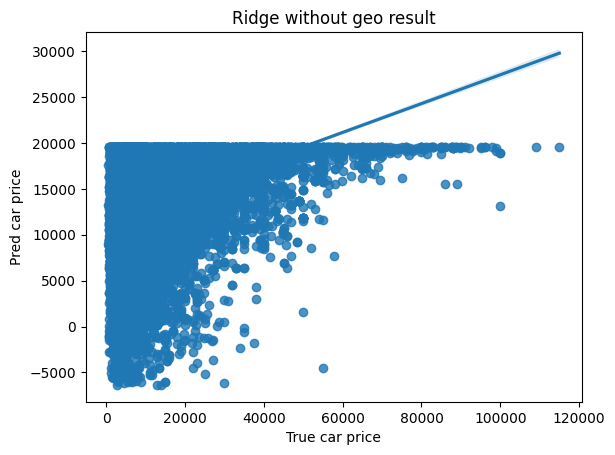

In [53]:
# Select price between 500 and 400000
# Drop column; id, VIN, model, region, state
# Drop NaN
ridge_model_wo_geo = Pipeline([
    ("preprocessing", mct),
    ("ridge", Ridge())
])

ridge_model_wo_geo.fit(X_train_wo_geo, y_train_wo_geo)

ridge_wo_geo_y_pred = ridge_model_wo_geo.predict(X_test_wo_geo)
mse_ridge_model_wo_geo = mean_squared_error(y_test_wo_geo, ridge_wo_geo_y_pred)
mae_ridge_model_wo_geo = mean_absolute_error(y_test_wo_geo, ridge_wo_geo_y_pred)

mses["ridge_model_wo_geo"] = round(mse_ridge_model_wo_geo, 2)

print("Ridge Model_wo_geo MSE: ", mse_ridge_model_wo_geo)
print("Ridge Model_wo_geo MAE: ", mae_ridge_model_wo_geo)

mse_ridge_model_wo_geo_result = sns.regplot(x="True car price", y="Pred car price", data=pd.DataFrame({"True car price":y_test_wo_geo, "Pred car price":ridge_wo_geo_y_pred}))
mse_ridge_model_wo_geo_result.set_title("Ridge without geo result")


per_importance_ridge_model_wo_geo = permutation_importance(ridge_model_wo_geo, X_test_wo_geo, y_test_wo_geo)

for i in per_importance_ridge_model_wo_geo.importances_mean.argsort():
    print(f"{mct.get_feature_names_out()[i]}")

Lasso

c:\Users\hyssh\Anaconda3\envs\pcmlai\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:609: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 775428683820.1503, tolerance: 764737327.836267



Lasso Model_wo_geo MSE:  56446418.64097902
Lasso Model_wo_geo MAE:  5037.573474903983
onehotencoder__manufacturer_acura
onehotencoder__manufacturer_alfa-romeo
onehotencoder__manufacturer_aston-martin
onehotencoder__manufacturer_audi
onehotencoder__manufacturer_bmw
onehotencoder__manufacturer_cadillac
onehotencoder__manufacturer_chevrolet
onehotencoder__manufacturer_chrysler
onehotencoder__manufacturer_datsun
onehotencoder__manufacturer_dodge
onehotencoder__manufacturer_ferrari
onehotencoder__manufacturer_buick


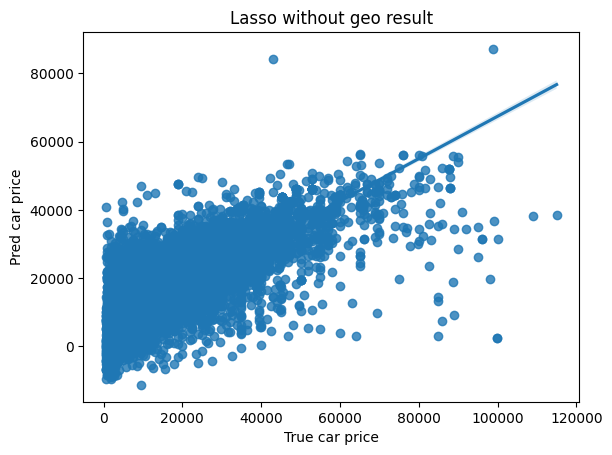

In [54]:
# Select price between 500 and 400000
# Drop column; id, VIN, model, region, state
# Drop NaN
lasso_model_wo_geo = Pipeline([
    ("preprocessing", mct),
    ("lasso", Lasso())
])

lasso_model_wo_geo.fit(X_train_wo_geo, y_train_wo_geo)

lasso_model_wo_geo_y_pred = lasso_model_wo_geo.predict(X_test_wo_geo)
mse_lasso_model_wo_geo = mean_squared_error(y_test_wo_geo, lasso_model_wo_geo_y_pred)
mae_lasso_model_wo_geo = mean_absolute_error(y_test_wo_geo, lasso_model_wo_geo_y_pred)

mses["lasso_model_wo_geo"] = round(mse_lasso_model_wo_geo, 2)

print("Lasso Model_wo_geo MSE: ", mse_lasso_model_wo_geo)
print("Lasso Model_wo_geo MAE: ", mae_lasso_model_wo_geo)

mse_lasso_model_wo_geo_result = sns.regplot(x="True car price", y="Pred car price", data=pd.DataFrame({"True car price":y_test_wo_geo, "Pred car price":lasso_model_wo_geo_y_pred}))
mse_lasso_model_wo_geo_result.set_title("Lasso without geo result")

per_importance_ridge_model_wo_geo = permutation_importance(ridge_model_wo_geo, X_test_wo_geo, y_test_wo_geo)

for i in per_importance_ridge_model_wo_geo.importances_mean.argsort():
    print(f"{mct.get_feature_names_out()[i]}")

In [55]:
lasso_coef = pd.DataFrame({"feature_names":lasso_model.named_steps["preprocessing"].get_feature_names_out(), "coef_":lasso_model.named_steps["lasso"].coef_})
lasso_coef["coef_"] = lasso_coef["coef_"].apply(lambda x: (float(x)))

In [56]:
lasso_coef[lasso_coef["coef_"] >0].sort_values("coef_", ascending=False).head(20)

,feature_names,coef_
414,onehotencoder__manufacturer_ferrari,70348.269119
440,onehotencoder__manufacturer_tesla,29691.888614
405,onehotencoder__manufacturer_aston-martin,27393.097329
435,onehotencoder__manufacturer_porsche,15088.814327
336,onehotencoder__region_southwest VA,12159.375443
452,onehotencoder__fuel_diesel,10856.323201
349,onehotencoder__region_stillwater,10231.541975
390,onehotencoder__region_wichita falls,9775.423687
444,onehotencoder__cylinders_10 cylinders,8237.283889
8,onehotencoder__region_anchorage / mat-su,8203.232102


In [57]:
lasso_coef[lasso_coef["coef_"] >0].sort_values("coef_", ascending=False).tail(20)

,feature_names,coef_
392,onehotencoder__region_wilmington,275.556913
64,onehotencoder__region_colorado springs,267.347451
174,onehotencoder__region_la crosse,262.345141
98,onehotencoder__region_elmira-corning,257.049538
541,onehotencoder__state_wv,212.874336
210,onehotencoder__region_medford-ashland,198.357060
162,onehotencoder__region_joplin,196.973787
295,onehotencoder__region_salem,185.215663
287,onehotencoder__region_richmond,174.273882
230,onehotencoder__region_new hampshire,162.425763


Lasso model perform better than others

<BarContainer object of 7 artists>

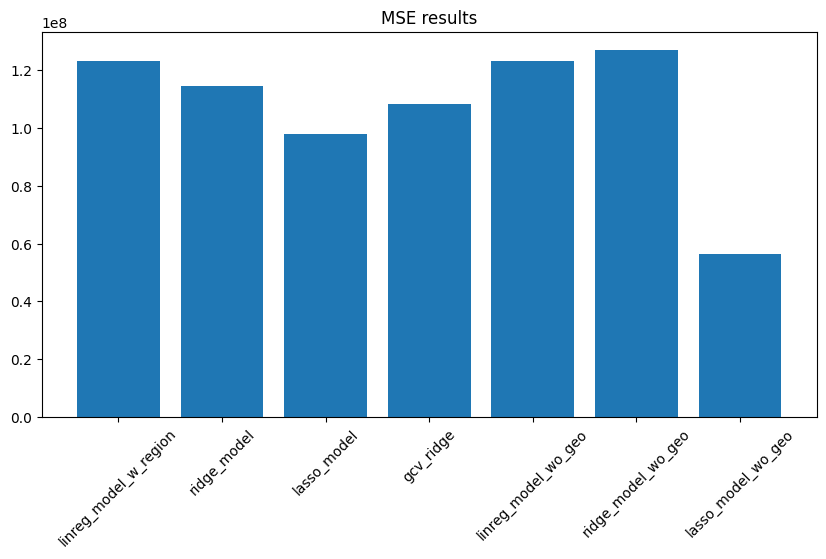

In [58]:
# mses
plt.figure(figsize=(10,5))
plt.xticks(rotation=45)
fig_bar_mses = plt.bar(x=[mse for mse in mses], height=[mses[mse] for mse in mses])
plt.title("MSE results")
fig_bar_mses

__Limitations__

So far the models couldn't predict expensive cars for example, 120,000 worth car predicted around 40,000 which is one third of true value.

Since it could cased by region and state differce, I'm going to train a model for a particular state.

In [59]:
ford_ca_df = df.query("manufacturer == 'ford' & state == 'ca'")
print(ford_ca_df.shape)
ford_ca_df.head()

(1310, 15)


,region,price,year,manufacturer,condition,cylinders,fuel,odometer,title_status,transmission,drive,size,type,paint_color,state
21213,bakersfield,31950,2006,ford,excellent,8 cylinders,diesel,98740.0,clean,automatic,4wd,full-size,truck,grey,ca
21317,bakersfield,6500,1986,ford,excellent,8 cylinders,gas,151000.0,clean,automatic,4wd,full-size,truck,brown,ca
21352,bakersfield,9250,1962,ford,salvage,8 cylinders,gas,64556.0,clean,manual,rwd,full-size,sedan,grey,ca
21381,bakersfield,32950,2006,ford,excellent,8 cylinders,diesel,78853.0,clean,automatic,4wd,full-size,truck,white,ca
21382,bakersfield,29950,2007,ford,excellent,8 cylinders,diesel,117288.0,clean,automatic,4wd,full-size,truck,black,ca


Ridge Model MSE:  172136863.0956494
Ridge Model MAE:  9562.402362558014

onehotencoder__region_inland empire
onehotencoder__region_los angeles
onehotencoder__region_bakersfield
onehotencoder__region_chico
onehotencoder__region_fresno / madera
onehotencoder__region_imperial county
onehotencoder__region_orange county
onehotencoder__region_gold country
onehotencoder__region_merced
onehotencoder__region_monterey bay
onehotencoder__region_humboldt county
onehotencoder__region_SF bay area
onehotencoder__region_mendocino county
onehotencoder__region_modesto


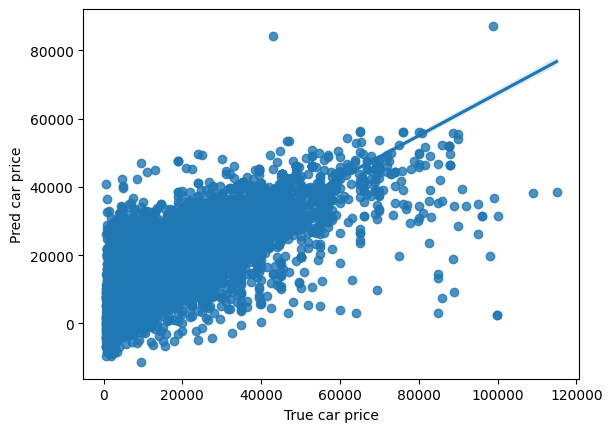

In [60]:
ford_ca_y= ford_ca_df[label_name]
ford_ca_X = ford_ca_df.drop(label_name, axis=1)

ford_ca_X_train, ford_ca_X_test, ford_ca_y_train, ford_ca_y_test = train_test_split(ford_ca_X, ford_ca_y, test_size=0.3)

ohe_column_names = ["region", "manufacturer", "cylinders", "fuel", "transmission", "drive", "size", "type", "paint_color", "state"]
oe_column_names = ["condition", "title_status"]

mct = make_column_transformer(
    (OneHotEncoder(handle_unknown="infrequent_if_exist"), ohe_column_names),
    (OrdinalEncoder(categories=[car_condition_order]), ["condition"]),
    (OrdinalEncoder(categories=[title_status_order]), ["title_status"]),
    (OrdinalEncoder(categories=[car_make_year]), ["year"]),
    (PolynomialFeatures(degree=2), ["odometer"])
)

ford_ca_lasso_model = Pipeline([
    ("preprocessing", mct),
    ("lasso", Lasso(positive=True))
])

ford_ca_lasso_model.fit(ford_ca_X_train, ford_ca_y_train)

ford_ca_y_pred = ford_ca_lasso_model.predict(ford_ca_X_test)
mse_ford_ca_lasso_model = mean_squared_error(ford_ca_y_test, ford_ca_y_pred)
mae_ford_ca_lasso_model = mean_absolute_error(ford_ca_y_test, ford_ca_y_pred)

mses["lasso_model_ford_ca"] = round(mse_ford_ca_lasso_model, 2)

print("Ridge Model MSE: ", mse_ford_ca_lasso_model)
print("Ridge Model MAE: ", mae_ford_ca_lasso_model)
print()

fig_regplot_ford_ca_result = sns.regplot(x="True car price", y="Pred car price", data=pd.DataFrame({"True car price":y_test_wo_geo, "Pred car price":lasso_model_wo_geo_y_pred}))
fig_regplot_ford_ca_result

per_importance_ford_ca_lasso_model = permutation_importance(ford_ca_lasso_model, ford_ca_X_test, ford_ca_y_test)

for i in per_importance_ford_ca_lasso_model.importances_mean.argsort():
    print(f"{mct.get_feature_names_out()[i]}")

In [61]:
ford_ca_lasso_model_lasso_coef = pd.DataFrame({"feature_names":ford_ca_lasso_model.named_steps["preprocessing"].get_feature_names_out(), "coef_":ford_ca_lasso_model.named_steps["lasso"].coef_})
ford_ca_lasso_model_lasso_coef["coef_"] = ford_ca_lasso_model_lasso_coef["coef_"].apply(lambda x: (float(x)))
ford_ca_lasso_model_lasso_coef[ford_ca_lasso_model_lasso_coef["coef_"] >0].sort_values("coef_", ascending=False).head(20)

,feature_names,coef_
41,onehotencoder__transmission_other,43593.917339
24,onehotencoder__region_susanville,17155.751841
56,onehotencoder__type_other,16950.382294
5,onehotencoder__region_humboldt county,16405.076021
61,onehotencoder__type_wagon,15425.279972
35,onehotencoder__fuel_diesel,14157.999405
30,onehotencoder__cylinders_3 cylinders,13285.831782
52,onehotencoder__type_coupe,12798.266154
26,onehotencoder__region_visalia-tulare,12034.892588
20,onehotencoder__region_santa barbara,11576.403937


In [62]:
ford_ca_lasso_model_lasso_coef[ford_ca_lasso_model_lasso_coef["coef_"] >0].sort_values("coef_", ascending=False).tail(20)

,feature_names,coef_
8,onehotencoder__region_los angeles,3359.851881
46,onehotencoder__size_full-size,3346.976231
70,onehotencoder__paint_color_red,3182.109355
39,onehotencoder__transmission_automatic,3170.521668
47,onehotencoder__size_mid-size,3037.493601
25,onehotencoder__region_ventura county,3007.453864
44,onehotencoder__drive_rwd,2883.627312
12,onehotencoder__region_monterey bay,2864.493726
37,onehotencoder__fuel_hybrid,2145.539526
32,onehotencoder__cylinders_5 cylinders,2131.672534


There is no improvement with the model. Rather keeping region and state help predict car price better.

Let try to 

(14601, 15)


c:\Users\hyssh\Anaconda3\envs\pcmlai\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:609: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 556834936.7502441, tolerance: 208650044.46237507



Ridge Model only Ford MSE:  135039985.93642387
Ridge Model only Ford MAE:  8415.825234727527

onehotencoder__region_abilene
onehotencoder__region_akron / canton
onehotencoder__region_albany
onehotencoder__region_amarillo
onehotencoder__region_ames
onehotencoder__region_anchorage / mat-su
onehotencoder__region_annapolis
onehotencoder__region_ashtabula
onehotencoder__region_asheville
onehotencoder__region_albuquerque
onehotencoder__region_SF bay area
onehotencoder__region_ann arbor
onehotencoder__region_appleton-oshkosh-FDL
onehotencoder__region_altoona-johnstown


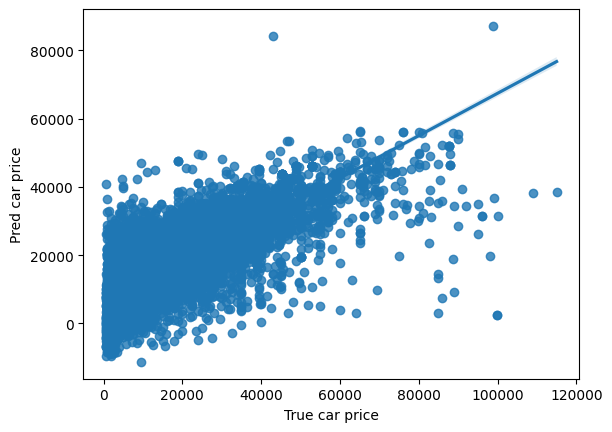

In [63]:
ford_df = df.query("manufacturer == 'ford'")

print(ford_df.shape)
ford_df.head()

ford_y= ford_df[label_name]
ford_X = ford_df.drop(label_name, axis=1)

ford_X_train, ford_X_test, ford_y_train, ford_y_test = train_test_split(ford_X, ford_y, test_size=0.3)

ohe_column_names = ["region", "manufacturer", "cylinders", "fuel", "transmission", "drive", "size", "type", "paint_color", "state"]
oe_column_names = ["condition", "title_status"]

mct = make_column_transformer(
    (OneHotEncoder(handle_unknown="infrequent_if_exist"), ohe_column_names),
    (OrdinalEncoder(categories=[car_condition_order]), ["condition"]),
    (OrdinalEncoder(categories=[title_status_order]), ["title_status"]),
    (OrdinalEncoder(categories=[car_make_year]), ["year"]),
    (PolynomialFeatures(degree=2), ["odometer"])
)

ford_lasso_model = Pipeline([
    ("preprocessing", mct),
    ("lasso", Lasso(positive=True))
])

ford_lasso_model.fit(ford_X_train, ford_y_train)

ford_y_pred = ford_lasso_model.predict(ford_X_test)
mse_ford_lasso_model = mean_squared_error(ford_y_test, ford_y_pred)
mae_ford_lasso_model = mean_absolute_error(ford_y_test, ford_y_pred)

mses["lasso_model_ford_all_states"] = round(mse_ford_lasso_model, 2)

print("Ridge Model only Ford MSE: ", mse_ford_lasso_model)
print("Ridge Model only Ford MAE: ", mae_ford_lasso_model)
print()

fig_regplot_ford_result = sns.regplot(x="True car price", y="Pred car price", data=pd.DataFrame({"True car price":y_test_wo_geo, "Pred car price":lasso_model_wo_geo_y_pred}))
fig_regplot_ford_result

per_importance_ford_lasso_model = permutation_importance(ford_lasso_model, ford_X_test, ford_y_test)

for i in per_importance_ford_lasso_model.importances_mean.argsort():
    print(f"{mct.get_feature_names_out()[i]}")

(74022, 15)
Lasso Model less than 100k  cars MSE:  95717825.63036078
Lasso Model less than 100k  cars MAE:  6962.739902744462

onehotencoder__region_ames
onehotencoder__region_abilene
onehotencoder__region_albany
onehotencoder__region_amarillo
onehotencoder__region_anchorage / mat-su
onehotencoder__region_annapolis
onehotencoder__region_albuquerque
onehotencoder__region_ashtabula
onehotencoder__region_asheville
onehotencoder__region_akron / canton
onehotencoder__region_SF bay area
onehotencoder__region_ann arbor
onehotencoder__region_appleton-oshkosh-FDL
onehotencoder__region_altoona-johnstown


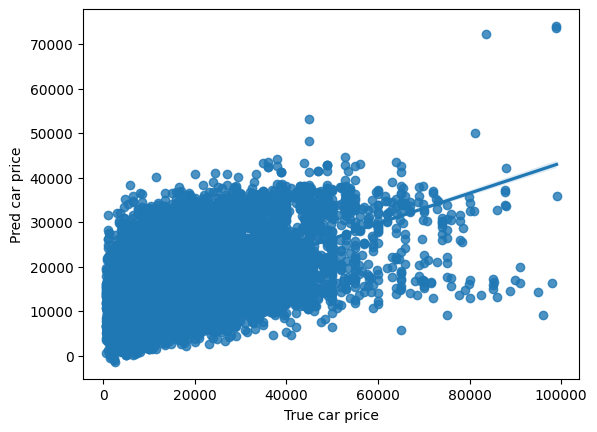

In [73]:
df_ls100k = df.query("price < 100000")

print(df_ls100k.shape)
df_ls100k.head()

ls100k_y= df_ls100k[label_name]
ls100k_X = df_ls100k.drop(label_name, axis=1)

ls100k_X_train, ls100k_X_test, ls100k_y_train, ls100k_y_test = train_test_split(ls100k_X, ls100k_y, test_size=0.3)

ohe_column_names = ["region", "manufacturer", "cylinders", "fuel", "transmission", "drive", "size", "type", "paint_color", "state"]
oe_column_names = ["condition", "title_status"]

mct = make_column_transformer(
    (OneHotEncoder(handle_unknown="infrequent_if_exist"), ohe_column_names),
    (OrdinalEncoder(categories=[car_condition_order]), ["condition"]),
    (OrdinalEncoder(categories=[title_status_order]), ["title_status"]),
    (OrdinalEncoder(categories=[car_make_year]), ["year"]),
    (PolynomialFeatures(degree=2), ["odometer"])
)

ls100k_lasso_model = Pipeline([
    ("preprocessing", mct),
    ("lasso", Lasso(positive=True))
])

ls100k_lasso_model.fit(ls100k_X_train, ls100k_y_train)

ls100k_y_pred = ls100k_lasso_model.predict(ls100k_X_test)
mse_ls100k_lasso_model = mean_squared_error(ls100k_y_test, ls100k_y_pred)
mae_ls100k_lasso_model = mean_absolute_error(ls100k_y_test, ls100k_y_pred)

mses["lasso_model_less_then_100k"] = round(mse_ls100k_lasso_model, 2)

print("Lasso Model less than 100k  cars MSE: ", mse_ls100k_lasso_model)
print("Lasso Model less than 100k  cars MAE: ", mae_ls100k_lasso_model)
print()

fig_regplot_ford_result = sns.regplot(x="True car price", y="Pred car price", data=pd.DataFrame({"True car price":ls100k_y_test, "Pred car price":ls100k_y_pred}))
fig_regplot_ford_result

per_importance_ls100k_lasso_model = permutation_importance(ls100k_lasso_model, ls100k_X_test, ls100k_y_test)

for i in per_importance_ls100k_lasso_model.importances_mean.argsort():
    print(f"{mct.get_feature_names_out()[i]}")

(70, 15)
Lasso Model for gt 100k MSE:  7.212163843701532e+17
Lasso Model for gt 100k MAE:  233746174.83367

onehotencoder__region_kalispell
onehotencoder__region_humboldt county
onehotencoder__region_eugene
onehotencoder__region_houston
onehotencoder__region_asheville
onehotencoder__region_akron / canton
onehotencoder__region_anchorage / mat-su
onehotencoder__region_charlotte
onehotencoder__region_delaware
onehotencoder__region_detroit metro
onehotencoder__region_albuquerque
onehotencoder__region_huntsville / decatur
onehotencoder__region_SF bay area
onehotencoder__region_austin


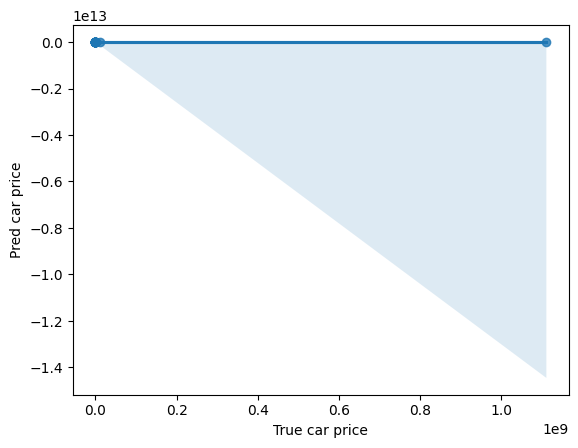

In [76]:
df_gt100k = used_car.drop(["id", "VIN", "model"], axis=1).query(\
    "price > 100000 & \
    odometer < @adj_max_car_odo"
    ).dropna()
    
df_gt100k["year"] = df_gt100k["year"].apply(lambda x: str(x).split(sep=".")[0])

print(df_gt100k.shape)
df_gt100k.head()

gt100k_y= df_gt100k[label_name]
gt100k_X = df_gt100k.drop(label_name, axis=1)

gt100k_X_train, gt100k_X_test, gt100k_y_train, gt100k_y_test = train_test_split(gt100k_X, gt100k_y, test_size=0.3)

ohe_column_names = ["region", "manufacturer", "cylinders", "fuel", "transmission", "drive", "size", "type", "paint_color", "state"]
oe_column_names = ["condition", "title_status"]

mct = make_column_transformer(
    (OneHotEncoder(handle_unknown="infrequent_if_exist"), ohe_column_names),
    (OrdinalEncoder(categories=[car_condition_order]), ["condition"]),
    (OrdinalEncoder(categories=[title_status_order]), ["title_status"]),
    (OrdinalEncoder(categories=[car_make_year]), ["year"]),
    (PolynomialFeatures(degree=2), ["odometer"])
)

gt100k_lasso_model = Pipeline([
    ("preprocessing", mct),
    ("lasso", Lasso(positive=True))
])

gt100k_lasso_model.fit(gt100k_X_train, gt100k_y_train)

gt100k_y_pred = gt100k_lasso_model.predict(gt100k_X_test)
mse_gt100k_lasso_model = mean_squared_error(gt100k_y_test, gt100k_y_pred)
mae_gt100k_lasso_model = mean_absolute_error(gt100k_y_test, gt100k_y_pred)

mses["lasso_model_gt_then_100k"] = round(mse_gt100k_lasso_model, 2)

print("Lasso Model for gt 100k MSE: ", mse_gt100k_lasso_model)
print("Lasso Model for gt 100k MAE: ", mae_gt100k_lasso_model)
print()

fig_regplot_gt100k_result = sns.regplot(x="True car price", y="Pred car price", data=pd.DataFrame({"True car price":gt100k_y_test, "Pred car price":gt100k_y_pred}))
fig_regplot_gt100k_result

per_importance_gt100k_lasso_model = permutation_importance(gt100k_lasso_model, gt100k_X_test, gt100k_y_test)

for i in per_importance_gt100k_lasso_model.importances_mean.argsort():
    print(f"{mct.get_feature_names_out()[i]}")

Model performs the best among others


<BarContainer object of 11 artists>

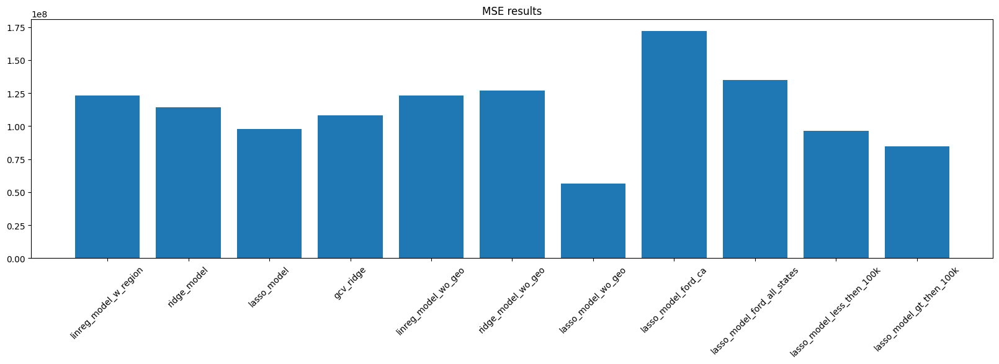

In [71]:
# mses
plt.figure(figsize=(20,5))
plt.xticks(rotation=45)
fig_bar_mses = plt.bar(x=[mse for mse in mses], height=[mses[mse] for mse in mses])
plt.title("MSE results")
fig_bar_mses

Do more fine tune with the best model I have

Grid Search Lasso Model with 100k less car MSE:  51987298.13346902
Grid Search Lasso Model with 100k less car MAE:  4857.292936419671
onehotencoder__region_anchorage / mat-su
onehotencoder__region_ames
onehotencoder__region_annapolis
onehotencoder__region_asheville
onehotencoder__region_albany
onehotencoder__region_akron / canton
onehotencoder__region_ann arbor
onehotencoder__region_ashtabula
onehotencoder__region_appleton-oshkosh-FDL
onehotencoder__region_albuquerque
onehotencoder__region_SF bay area
onehotencoder__region_abilene
onehotencoder__region_altoona-johnstown
onehotencoder__region_amarillo


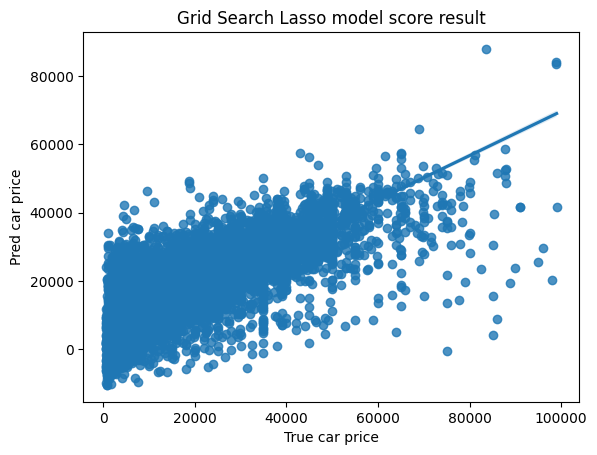

In [77]:
df_ls100k = df.query("price < 100000")

print(df_ls100k.shape)
df_ls100k.head()

ls100k_y= df_ls100k[label_name]
ls100k_X = df_ls100k.drop(label_name, axis=1)

ls100k_X_train, ls100k_X_test, ls100k_y_train, ls100k_y_test = train_test_split(ls100k_X, ls100k_y, test_size=0.3)

ohe_column_names = ["region", "manufacturer", "cylinders", "fuel", "transmission", "drive", "size", "type", "paint_color", "state"]
oe_column_names = ["condition", "title_status"]

mct = make_column_transformer(
    (OneHotEncoder(handle_unknown="infrequent_if_exist"), ohe_column_names),
    (OrdinalEncoder(categories=[car_condition_order]), ["condition"]),
    (OrdinalEncoder(categories=[title_status_order]), ["title_status"]),
    (OrdinalEncoder(categories=[car_make_year]), ["year"]),
    (PolynomialFeatures(degree=2), ["odometer"])
)

lasso_model = Pipeline([
    ("preprocessing", mct),
    ("lasso", Lasso())
])

params = {
    "lasso__alpha":[0.01, 0.1],
    "lasso__fit_intercept":[True, False],
    "preprocessing__polynomialfeatures__degree":[2]
}

ls100k_gcv_lasso = GridSearchCV(
    estimator=lasso_model,
    param_grid=params,
    scoring="neg_mean_squared_error",
    cv=5
)

ls100k_gcv_lasso.fit(X=ls100k_X_train, y=ls100k_y_train)

gcv_ls100k_lasso_y_pred = ls100k_gcv_lasso.best_estimator_.predict(ls100k_X_test)
mse_ls100k_gcv_lasso = mean_squared_error(ls100k_y_test, gcv_ls100k_lasso_y_pred)
mae_ls100k_gcv_lasso = mean_absolute_error(ls100k_y_test, gcv_ls100k_lasso_y_pred)

mses["gt100k_gcv_lasso"] = round(mse_ls100k_gcv_lasso, 2)

print("Grid Search Lasso Model with 100k less car MSE: ", mse_ls100k_gcv_lasso)
print("Grid Search Lasso Model with 100k less car MAE: ", mae_ls100k_gcv_lasso)

fig_scatter_gcv_lasso_result = sns.regplot(x="True car price", y="Pred car price", data=pd.DataFrame({"True car price":ls100k_y_test, "Pred car price":gcv_ls100k_lasso_y_pred}))
fig_scatter_gcv_lasso_result.set_title("Grid Search Lasso model score result")
fig_scatter_gcv_lasso_result.figure.savefig("./images/fig_regplot_Lasso_gridcv_result.png")

per_importance_gcv_lasso_best_model = permutation_importance(ls100k_gcv_lasso.best_estimator_, ls100k_X_test, ls100k_y_test)

for i in per_importance_gcv_lasso_best_model.importances_mean.argsort():
    print(f"{ls100k_gcv_lasso.best_estimator_[0].get_feature_names_out()[i]}")


In [81]:
df_ls100k.head()

,region,price,year,manufacturer,condition,cylinders,fuel,odometer,title_status,transmission,drive,size,type,paint_color,state
31,auburn,15000,2013,ford,excellent,6 cylinders,gas,128000.0,clean,automatic,rwd,full-size,truck,black,al
55,auburn,19900,2004,ford,good,8 cylinders,diesel,88000.0,clean,automatic,4wd,full-size,pickup,blue,al
59,auburn,14000,2012,honda,excellent,6 cylinders,gas,95000.0,clean,automatic,fwd,full-size,mini-van,silver,al
65,auburn,22500,2001,ford,good,8 cylinders,diesel,144700.0,clean,manual,rwd,full-size,truck,white,al
73,auburn,15000,2017,dodge,excellent,8 cylinders,gas,90000.0,rebuilt,automatic,rwd,mid-size,sedan,grey,al


In [79]:
ls100k_gcv_lasso.best_estimator_

gcv_lasso_model_lasso_coef = pd.DataFrame({"feature_names":ls100k_gcv_lasso.best_estimator_.named_steps["preprocessing"].get_feature_names_out(), "coef_":ls100k_gcv_lasso.best_estimator_.named_steps["lasso"].coef_})
gcv_lasso_model_lasso_coef["coef_"] = gcv_lasso_model_lasso_coef["coef_"].apply(lambda x: (float(x)))
gcv_lasso_model_lasso_coef[gcv_lasso_model_lasso_coef["coef_"] >0].sort_values("coef_", ascending=False).head(20)

,feature_names,coef_
412,onehotencoder__manufacturer_ferrari,82391.208109
438,onehotencoder__manufacturer_tesla,54951.908758
403,onehotencoder__manufacturer_aston-martin,52278.397245
433,onehotencoder__manufacturer_porsche,35243.163017
410,onehotencoder__manufacturer_datsun,34288.560373
423,onehotencoder__manufacturer_land rover,32322.458987
435,onehotencoder__manufacturer_rover,26964.172748
424,onehotencoder__manufacturer_lexus,26756.415538
439,onehotencoder__manufacturer_toyota,26624.450446
402,onehotencoder__manufacturer_alfa-romeo,26481.825571


In [80]:
gcv_lasso_model_lasso_coef[gcv_lasso_model_lasso_coef["coef_"] >0].sort_values("coef_", ascending=False).tail(20)

,feature_names,coef_
166,onehotencoder__region_kenai peninsula,1.232485e+02
305,onehotencoder__region_santa fe / taos,1.217963e+02
106,onehotencoder__region_finger lakes,1.198357e+02
495,onehotencoder__state_co,1.180824e+02
99,onehotencoder__region_erie,1.147557e+02
141,onehotencoder__region_helena,1.141355e+02
351,onehotencoder__region_syracuse,1.102527e+02
173,onehotencoder__region_kokomo,1.033680e+02
384,onehotencoder__region_western maryland,9.604493e+01
23,onehotencoder__region_beaumont / port arthur,6.962329e+01


### Deployment

Now that we've settled on our models and findings, it is time to deliver the information to the client.  You should organize your work as a basic report that details your primary findings.  Keep in mind that your audience is a group of used car dealers interested in fine tuning their inventory.